<a href="https://colab.research.google.com/github/arpanbiswas52/SANE/blob/main/Analysis/SANE_BEPS(Notebook_Github).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Strategic (S) Autonomous (A) Noisy (N) Experiments (E)**
Aug, 2024

Tutorial for Stategic BO where the idea is to also exploit the local optimal solution rather than only focus of BO to identify the global optimal solution

In real time, experts also want to learn the material structure-property relationship at the local region of interest and want to spend some time exploring those spaces. However, the classical BO is a global optimization tool where it only focus on exploiting to converge to optimal region globally and avoid local optima. Here, we aim to define BO with strategic exploration to indentify a potential optimal region and exploit sufficiently to extract physical knowledge and the move to identify the next optimal region. This approach is well suited when we have mutiple local and global region of interest and the domain expert want to learn all the region, but with limited experiments.

In this notebook, SANE is integrated with <i> partial human-intervened dynamic constraint </i> and implemented on a <b> vertical band excitation piezoresponse spectroscopy (BEPS) data of a PbTiO3 (PTO) thin film </b>

-- Notebook prepared by **Arpan Biswas**

## Install & Import

Install GPax package:

In [ ]:
!pip install -q gpax
!pip install -q atomai  # we will use the atomai's utility function for preparing the input data
!pip install sidpy
!pip install bglib
!pip install --upgrade gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.4/103.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 371.7/371.7 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 348.1/348.1 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.1/274.1 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.4/176.4 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.3 MB/s eta 0:00:00
  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 29.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━

In [ ]:
!pip install sidpy
!pip install pyNSID
!pip install mycolorpy

  Preparing metadata (setup.py) ... done
  Created wheel for mycolorpy: filename=mycolorpy-1.5.1-py3-none-any.whl size=3850 sha256=141d984e366c7a248dd433ede947c7339479d926cba0def872cadbf4e02b4f72
  Stored in directory: /root/.cache/pip/wheels/d6/1d/04/f8bfb8b04e3daba330b3f377c041b89304271ff98fb6704946
Successfully built mycolorpy


Import needed packages:

In [ ]:
import gpax
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import h5py
import sidpy

from mycolorpy import colorlist as mcp

gpax.utils.enable_x64()  # enable double precision

from warnings import filterwarnings

import math


from sklearn.model_selection import train_test_split

from atomai.utils import get_coord_grid, extract_patches_and_spectra, extract_subimages

import h5py
import sidpy
import pyUSID as usid


## Load BEPS data

In [ ]:
!gdown https://drive.google.com/uc?id=1D5P4pxGEyk_R09k6Iwx8pTCC-z5T2SfX

Downloading...
From (original): https://drive.google.com/uc?id=1D5P4pxGEyk_R09k6Iwx8pTCC-z5T2SfX
From (redirected): https://drive.google.com/uc?id=1D5P4pxGEyk_R09k6Iwx8pTCC-z5T2SfX&confirm=t&uuid=b8ef15c1-5fcb-49da-9b67-3f392f0b514e
To: /content/BEPS_1d5um_PTO_0001.h5
100% 1.69G/1.69G [00:41<00:00, 40.9MB/s]


In [ ]:
input_file = "/content/BEPS_1d5um_PTO_0001.h5"
h5_f = h5py.File(input_file, 'r+')
sidpy.hdf.hdf_utils.print_tree(h5_f)

/
├ Measurement_000
  ---------------
  ├ Channel_000
    -----------
    ├ Bin_FFT
    ├ Bin_Frequencies
    ├ Bin_Indices
    ├ Bin_Step
    ├ Excitation_Waveform
    ├ Noise_Floor
    ├ Position_Indices
    ├ Position_Values
    ├ Raw_Data
    ├ Raw_Data-SHO_Fit_000
      --------------------
      ├ Guess
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
    ├ Raw_Data-SHO_Fit_001
      --------------------
      ├ Fit
      ├ Guess
      ├ Spectroscopic_Indices
      ├ Spectroscopic_Values
      ├ completed_fit_positions
      ├ completed_guess_positions
    ├ Spatially_Averaged_Plot_Group_000
      ---------------------------------
      ├ Bin_Frequencies
      ├ Mean_Spectrogram
      ├ Spectroscopic_Parameter
      ├ Step_Averaged_Response
    ├ Spectroscopic_Indices
    ├ Spectroscopic_Values
    ├ UDVS
    ├ UDVS_Indices
  ├ Channel_001
    -----------
    ├ Position_Indices
    ├ Position_Values
    ├ Raw_Data
    ├ Spectroscopic_Indices
    ├ Spectroscopic_Values
 

In [ ]:
sho_mat = h5_f['Measurement_000/Channel_000/Raw_Data-SHO_Fit_001/Fit']
spec_val = h5_f['Measurement_000/Channel_000/Raw_Data-SHO_Fit_000/Spectroscopic_Values']
pos_inds = h5_f['Measurement_000/Channel_000/Position_Indices']
pos_dim_sizes = [np.max(pos_inds[:,0])+1, np.max(pos_inds[:,1]+1)]
topo = h5_f['Measurement_000/Channel_001/Raw_Data/']['r']

sho_mat_ndim = sho_mat[:].reshape(pos_dim_sizes[0], pos_dim_sizes[1], -1)
amp_mat_ndim = sho_mat_ndim['Amplitude [V]']
phase_mat_ndim = sho_mat_ndim['Phase [rad]']
fre_mat_ndim = sho_mat_ndim['Frequency [Hz]']
q_mat_ndim = sho_mat_ndim['Quality Factor']

In [ ]:
plt.figure()
plt.hist(phase_mat_ndim.ravel(),bins = 100);

min_ = np.min(phase_mat_ndim)
max_ = np.max(phase_mat_ndim)

pha_correct = np.where(phase_mat_ndim > 1.5, phase_mat_ndim + (min_-max_), phase_mat_ndim)

pha_correct = pha_correct + np.pi-0.75

plt.figure()
plt.hist(pha_correct.reshape(-1),bins = 100);
plt.axvline(np.pi, color ='red')
plt.axvline(0, color ='red')

In [ ]:
#separate on field and off field
full_spec_len = sho_mat_ndim.shape[2]
spec_len = int(full_spec_len/2)
pix_x, pix_y = sho_mat_ndim.shape[0], sho_mat_ndim.shape[1]

amp_off_field = np.zeros((pix_x, pix_y, spec_len))
pha_off_field = np.zeros((pix_x, pix_y, spec_len))
fre_off_field = np.zeros((pix_x, pix_y, spec_len))

amp_on_field = np.zeros((pix_x, pix_y, spec_len))
pha_on_field = np.zeros((pix_x, pix_y, spec_len))
fre_on_field = np.zeros((pix_x, pix_y, spec_len))

v_step = np.zeros(spec_len)

for i in range (spec_len):
  amp_off_field[:,:, i] = amp_mat_ndim[:,:,2*i+1]
  pha_off_field[:,:, i] = pha_correct[:,:,2*i+1]
  fre_off_field[:,:, i] = fre_mat_ndim[:,:,2*i+1]/1000
  amp_on_field[:,:, i] = amp_mat_ndim[:,:,2*i]
  pha_on_field[:,:, i] = pha_correct[:,:,2*i]
  fre_on_field[:,:, i] = fre_mat_ndim[:,:,2*i]/1000
  v_step[i] = spec_val[0,2*i]

pola_off_field = amp_off_field*np.cos(pha_off_field)

In [ ]:
f, (ax1,ax2, ax3, ax4) = plt.subplots(1,4, figsize = (24,4))
ax1.plot(v_step, amp_off_field.mean(axis = (0, 1)))
ax1.set_xlabel('Voltage (V)')
ax1.set_ylabel('Amplitude (a.u.)')

ax2.plot(v_step, pha_off_field.mean(axis = (0, 1)))
ax2.set_xlabel('Voltage (V)')
ax2.set_ylabel('Phase (rad)')

ax3.plot(v_step, fre_off_field.mean(axis = (0, 1)))
ax3.set_xlabel('Voltage (V)')
ax3.set_ylabel('Frequency (kHz)')

ax4.plot(v_step, pola_off_field.mean(axis = (0, 1)))
ax4.set_xlabel('Voltage (V)')
ax4.set_ylabel('Polarization (a.u.)')

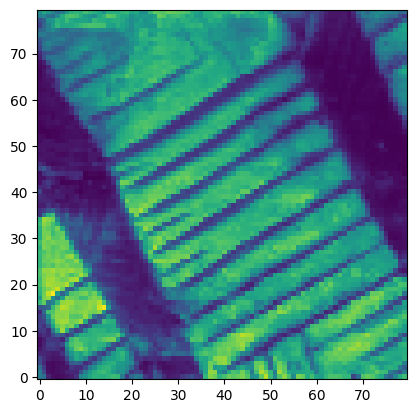

In [ ]:
# Structure image - We will explore this image space
plt.imshow(amp_off_field.mean(2), origin="lower")

Text(0.5, 1.0, 'Structure Image')

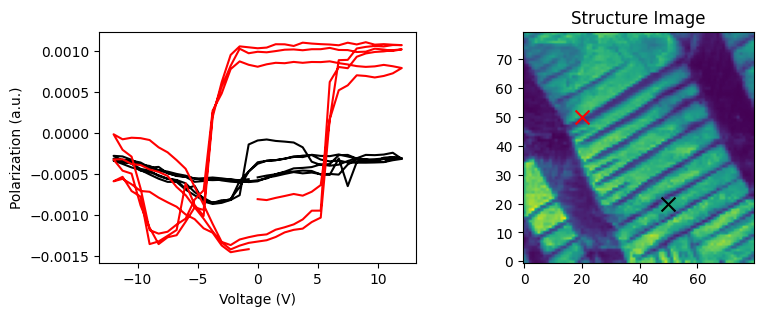

In [ ]:
struc_img = amp_off_field.mean(2)
plot_pixx1 = 50; plot_pixy1 = 20
plot_pixx2 = 20; plot_pixy2 = 50
# Plot spectrum and image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 3))
ax1.plot(v_step, pola_off_field[plot_pixx1, plot_pixy1], c = 'k')
ax1.plot(v_step, pola_off_field[plot_pixx2, plot_pixy2], c = 'r')
ax1.set_xlabel('Voltage (V)')
ax1.set_ylabel('Polarization (a.u.)')

ax2.imshow(struc_img, origin="lower")
ax2.scatter(plot_pixx1, plot_pixy1, marker='x', s=100, c='k')
ax2.scatter(plot_pixx2, plot_pixy2, marker='x', s=100, c='r')
ax2.set_title('Structure Image')
#ax2.axis("off")

Generate training inputs (image patches) and targets (spectra)

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()

In [ ]:
img = norm_(struc_img)
spectra = norm_(pola_off_field)

coordinates = get_coord_grid(img, step = 1, return_dict=False)

# extract subimage for each point on a grid
window_size = 16
features_all, coords, _ = extract_subimages(img, coordinates, window_size)
features_all = features_all[:,:,:,0]
coords = np.array(coords, dtype=int)

print(coords.shape)
print(features_all.shape)
print(spectra.shape)

(4225, 2)
(4225, 16, 16)
(80, 80, 192)


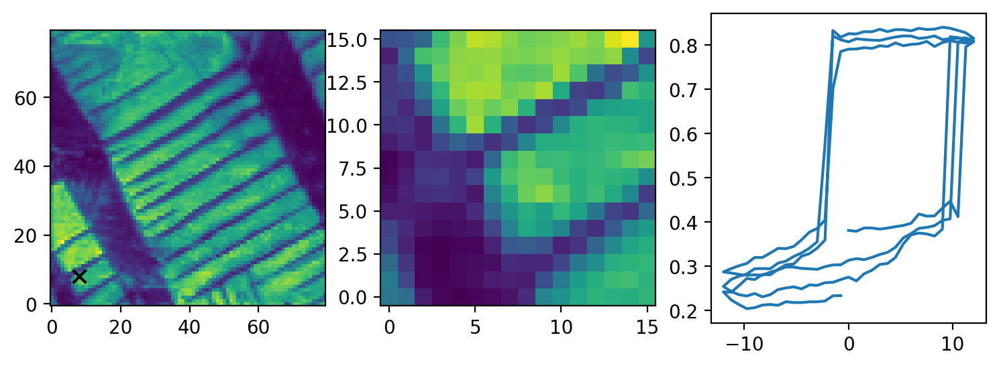

In [ ]:
#Plot an example patch and spectrum
k = 0

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 3), dpi =200)
ax1.imshow(img, origin="lower")
ax1.scatter(coords[k, 1], coords[k, 0], marker='x', s=50, c='k')

#ax1.axis("off")
ax2.imshow(features_all[k], origin="lower")
#ax2.axis("off")
ax3.plot(v_step, spectra[coords[k, 0], coords[k, 1]])

In [ ]:
targets = spectra[coords[:, 0], coords[:, 1]]
print('target spectra shape: ', targets.shape)
print('image patch shape: ', features_all.shape)
# check if the spectra target is correct
plt.imshow(targets.reshape(img.shape[0]-window_size+1, img.shape[1]-window_size+1, -1).mean(2), origin = "lower")

In [ ]:
features, targets = norm_(features_all), norm_(targets)

# Define scalarizer

In [ ]:
def loop_area (raw_spec, cycle) :
  raw_spec_len = len(raw_spec)
  cycle_len = int(raw_spec_len / cycle)
  half_len = int(cycle_len / 2)
  q_len = int(cycle_len / 4)
  loop_top, loop_bottom = [], []
  loop_top.append(raw_spec[q_len : q_len + half_len])
  loop_top.append(raw_spec[q_len + 2*half_len : q_len + 3*half_len])
  loop_top.append(raw_spec[q_len + 4*half_len : 2*q_len + 4*half_len])
  loop_bottom.append(raw_spec[:q_len])
  loop_bottom.append(raw_spec[q_len + half_len: q_len + 2*half_len])
  loop_bottom.append(raw_spec[q_len + 3*half_len: q_len + 4*half_len])
  loop_top = np.concatenate(loop_top)
  loop_bottom = np.concatenate(loop_bottom)
  return np.abs(np.sum(loop_top)-np.sum(loop_bottom))

In [ ]:
# First way to extract scalarizer
loop_areas_all, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    looparea = loop_area(t, 3)
    loop_areas_all.append(np.array([looparea]))
    features_all.append(features[i])
    indices_all.append(coords[i])
loop_areas_all = np.concatenate(loop_areas_all)
features_all = np.array(features_all)
indices_all = np.array(indices_all)
indices_all_norm = norm_(indices_all)

# Plot the scalarized target value
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], c=loop_areas_all)
ax1.set_title('Ground truth: Loop Area')
ax1.set_aspect('equal')

ax2.imshow(struc_img, origin = "lower")
ax2.set_title('Structure Image')
#ax2.axis("off")

# Generate training data to initialize BO

In [ ]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
y = norm_(loop_areas_all)

exploration_steps = 100
testsize = 5

X.shape, y.shape

((4225, 256), (4225,))

In [ ]:
n = 30
lb = 0
ub = 4225
bounds = [lb, ub]
#np.random.seed(1000)
sampler = scipy.stats.qmc.LatinHypercube(d=1, scramble=True, seed=1)
train_idx = bounds[0] + (bounds[1] - bounds[0])  * sampler.random(n=n)
#train_x = bounds[0] + (bounds[1] - bounds[0]) * np.random.rand(n, 2)
train_idx = np.round(train_idx)
train_idx = train_idx.astype(int)


train_idx

array([[2463],
       [1556],
       [3923],
       [2120],
       [ 801],
       [ 926],
       [ 306],
       [  83],
       [3584],
       [2390],
       [2851],
       [1333],
       [4179],
       [1720],
       [3056],
       [3739],
       [3361],
       [2619],
       [ 535],
       [1090],
       [2711],
       [1510],
       [3171],
       [3946],
       [1836],
       [ 602],
       [1191],
       [3482],
       [ 259],
       [1976]])

In [ ]:
train_x = np.zeros((len(train_idx), X.shape[-1]))
train_y = np.zeros((len(train_x)))
train_indices = np.zeros((len(train_x), 2))
train_indices_norm = np.zeros((len(train_x), 2))
for i in range(len(train_x)):
    train_x[i, :] = X[train_idx[i], :]
    train_y[i] = y[train_idx[i]]
    train_indices[i, :] = indices_all[train_idx[i], :]
    train_indices_norm[i, :] = indices_all_norm[train_idx[i], :]


train_x.shape, train_indices, train_indices_norm, train_y

<ipython-input-21-9c3d123497e9>:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  train_y[i] = y[train_idx[i]]


((30, 256),
 array([[45., 66.],
        [31., 69.],
        [68., 31.],
        [40., 48.],
        [20., 29.],
        [22., 24.],
        [12., 54.],
        [ 9., 26.],
        [63., 17.],
        [44., 58.],
        [51., 64.],
        [28., 41.],
        [72., 27.],
        [34., 38.],
        [55.,  9.],
        [65., 42.],
        [59., 54.],
        [48., 27.],
        [16., 23.],
        [24., 58.],
        [49., 54.],
        [31., 23.],
        [56., 59.],
        [68., 54.],
        [36., 24.],
        [17., 25.],
        [26., 29.],
        [61., 45.],
        [11., 72.],
        [38., 34.]]),
 array([[0.578125, 0.90625 ],
        [0.359375, 0.953125],
        [0.9375  , 0.359375],
        [0.5     , 0.625   ],
        [0.1875  , 0.328125],
        [0.21875 , 0.25    ],
        [0.0625  , 0.71875 ],
        [0.015625, 0.28125 ],
        [0.859375, 0.140625],
        [0.5625  , 0.78125 ],
        [0.671875, 0.875   ],
        [0.3125  , 0.515625],
        [1.      , 0.29687

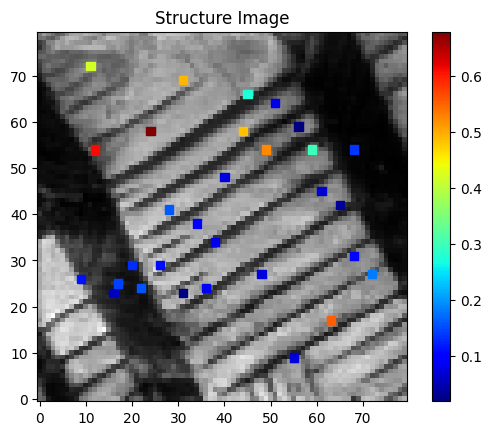

In [ ]:
plt.imshow(struc_img, origin = "lower", cmap="gray")
a=plt.scatter(train_indices[:, 0], train_indices[:, 1], c=train_y, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Structure Image')
#plt.axis("off")
plt.show()

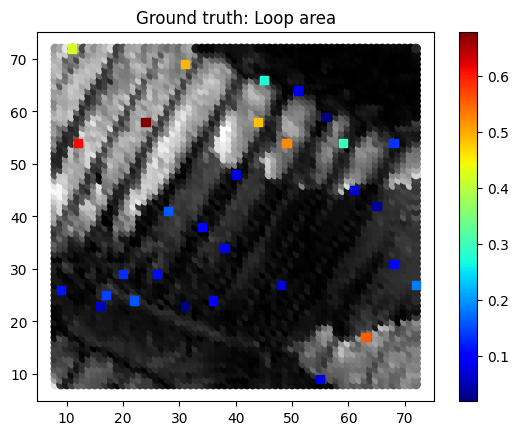

In [ ]:
plt.scatter(indices_all[:, 0], indices_all[:, 1], c=loop_areas_all, cmap="gray")
a=plt.scatter(train_indices[:, 0], train_indices[:, 1], c=train_y, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Ground truth: Loop area')
#plt.axis("off")
plt.show()

In [ ]:
def plot_result(indices, obj):
    plt.figure(figsize = (4, 4))
    a = plt.scatter(indices[:, 0], indices[:, 1], s=10, c=obj)
    plt.colorbar(a)
    next_point = indices[obj.argmax()]
    plt.scatter(next_point[0], next_point[1], s=10, marker='s', c='r', linewidths=2)
    #plt.xticks([])
    #plt.yticks([])
    plt.title("Acquisition Values")
    plt.show()

# Prepare training data

In [ ]:
X_measured = train_x
y_measured = train_y
indices_measured = train_indices
X_measured.shape, y_measured.shape, indices_measured.shape

((30, 256), (30,), (30, 2))

In [ ]:
X_unmeasured = np.delete(X, train_idx, 0)
y_unmeasured = np.delete(y, train_idx, 0)
indices_unmeasured = np.delete(indices_all, train_idx, 0)
X_unmeasured.shape, y_unmeasured.shape, indices_unmeasured.shape

((4195, 256), (4195,), (4195, 2))

In [ ]:

data_dim = train_x.shape[-1]

key1, key2 = gpax.utils.get_keys(1)
for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dkl = gpax.viDKL(data_dim, 2, kernel='Matern')
    dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
        key1, X_measured, y_measured, num_steps=1000, step_size=0.005)

    y_pred, y_var = dkl.predict(key2, X)
    # Compute acquisition function
    obj = gpax.acquisition.EI(key2, dkl, X_unmeasured, maximize=True, noiseless=True)
    # Select next point to "measure"
    next_point_idx = obj.argmax()
    # Do "measurement"
    measured_point = y_unmeasured[next_point_idx]
    # Plot current result
    if ((e == 0) or ((e % 10) == 0)): # Check predictions after every 10 BO runs
      fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
      ax[0, 0].imshow(struc_img, origin = "lower")
      a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 0].set_title("Structure Image")

      a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
      ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 1].set_title("Ground Truth")

      #b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
      b= ax[1, 0].scatter(indices_all[:, 0], indices_all[:, 1], c=y_pred)
      plt.colorbar(b, orientation='vertical')
      ax[1, 0].set_xlabel("x1")
      ax[1, 0].set_ylabel("x2")
      ax[1, 0].set_title("GPmean")

      #b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
      b= ax[1, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y_var)
      plt.colorbar(b, orientation='vertical')
      ax[1, 1].set_xlabel("x1")
      ax[1, 1].set_ylabel("x2")
      ax[1, 1].set_title("GPvar")
      plt.show()

    plot_result(indices_unmeasured, obj)
    #np.savez("singleDKL_step{}.npz".format(e), next_point_idx = next_point_idx, obj = obj, X_measured = X_measured,
    #         X_unmeasured = X_unmeasured, y_measured = y_measured, y_unmeasured = y_unmeasured,
    #         indices_measured = indices_measured, indices_unmeasured = indices_unmeasured)
    # Update the arrays of measured/unmeasured points
    X_measured = np.append(X_measured, X_unmeasured[next_point_idx][None], 0)
    X_unmeasured = np.delete(X_unmeasured, next_point_idx, 0)
    y_measured = np.append(y_measured, measured_point)
    y_unmeasured = np.delete(y_unmeasured, next_point_idx)
    indices_measured = np.append(indices_measured, indices_unmeasured[next_point_idx][None], 0)
    indices_unmeasured = np.delete(indices_unmeasured, next_point_idx, 0)

Final prediction

In [ ]:
rng_key, rng_key_predict = gpax.utils.get_keys(1)
data_dim = X.shape[-1]
# update posterior
dkl = gpax.viDKL(data_dim, 2, kernel='Matern')
dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
    rng_key, X_measured, y_measured, num_steps=1000, step_size=0.005)
y_pred, y_var = dkl.predict(rng_key_predict, X)

100%|██████████| 1000/1000 [00:04<00:00, 217.02it/s, init loss: 20289.5027, avg. loss [951-1000]: 18956.0413]



Inferred GP kernel parameters
k_length         [0.3915 0.3202]
k_scale          0.454
noise            0.0114


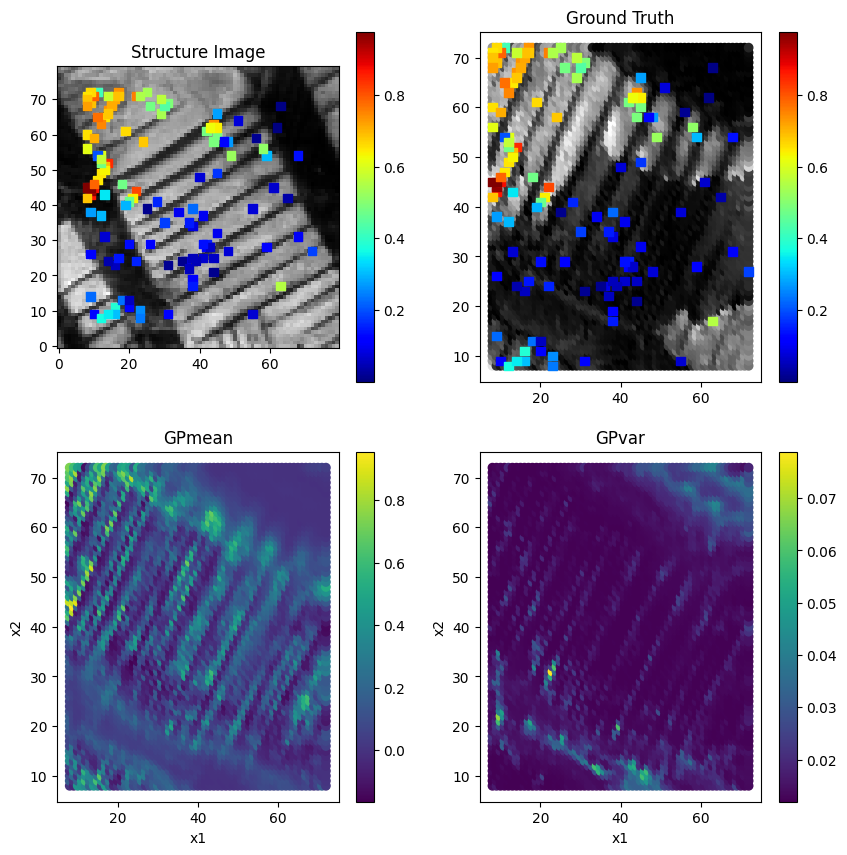

In [ ]:
fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
ax[0, 0].imshow(struc_img, origin = "lower", cmap="gray")
a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 0].set_title("Structure Image")

ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y, cmap="gray")
a = ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 1].set_title("Ground Truth")

#b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
b= ax[1, 0].scatter(indices_all[:, 0], indices_all[:, 1], c=y_pred)
plt.colorbar(b, orientation='vertical')
ax[1, 0].set_xlabel("x1")
ax[1, 0].set_ylabel("x2")
ax[1, 0].set_title("GPmean")

#b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
b= ax[1, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y_var)
plt.colorbar(b, orientation='vertical')
ax[1, 1].set_xlabel("x1")
ax[1, 1].set_ylabel("x2")
ax[1, 1].set_title("GPvar")
plt.show()

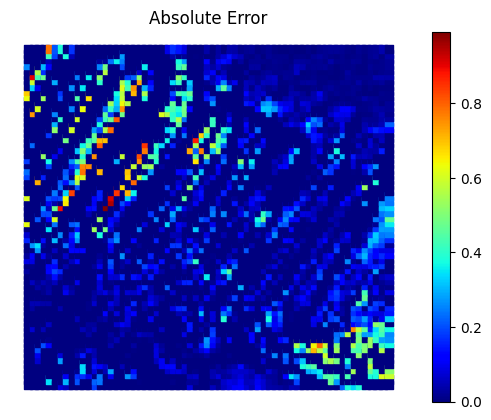

Mean error: 0.06400509169814504


In [ ]:
a=plt.scatter(indices_all[:, 0], indices_all[:, 1], c=np.abs(y-y_pred)*c_m_SANE_dc, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Absolute Error')
plt.axis("off")
plt.show()
print("Mean error: "+str(np.mean(np.abs(y-y_pred)*c_m_SANE_dc)))

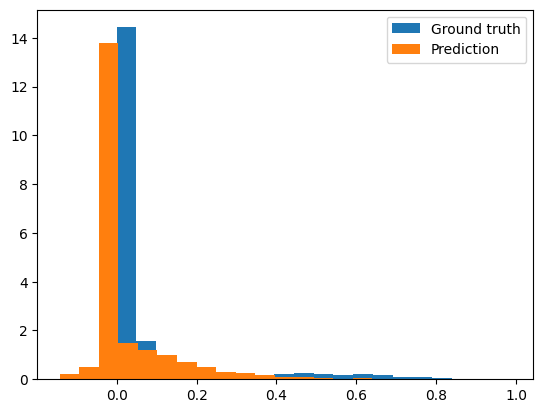

In [ ]:
plt.hist(y*c_m_SANE_dc, bins=20, density=True, label="Ground truth")
plt.hist(y_pred*c_m_SANE_dc, bins=20, density=True, label="Prediction")
plt.legend()
plt.show()

In [ ]:
hist1, _ = np.histogram(y*c_m_SANE_dc, bins=20, density=True)
hist2, _ = np.histogram(y_pred*c_m_SANE_dc, bins=20, density=True)
minima = np.minimum(hist1, hist2)
intersection = np.true_divide(np.sum(minima), np.sum(hist2))
intersection

0.21696944611220184

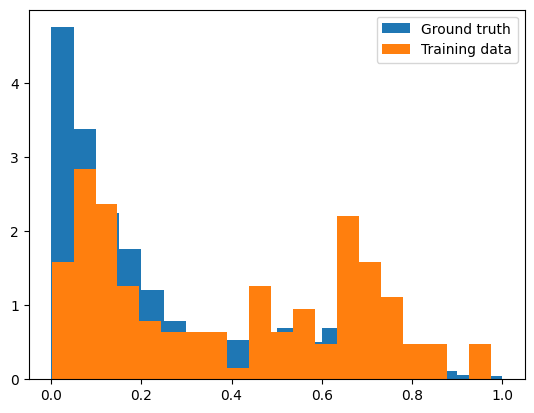

In [ ]:
plt.hist(y, bins=20, density=True, label="Ground truth")
#plt.hist(y*c_m, bins=20, density=True, label="Ground truth with constraint")
plt.hist(y_measured, bins=20, density=True, label="Training data")
plt.legend()
plt.show()

In [ ]:
indices_measured_BO = indices_measured
np.save("indices_measured_BO.npy", indices_measured_BO)
y_pred_BO = y_pred
y_measured_BO = y_measured
np.save("y_pred_BO.npy", y_pred_BO)
np.save("y_measured_BO.npy", y_measured_BO)

#Strategic BO

-- Functions

In [ ]:
import time
# Function for perform voting to assess spectral quality
def votes_initialdata(img, X_indices, data, idx):
    beps_wv= data[0]
    spectra = data[1]
    idx_good = []
    idx_bad = []
    for i in range(0, len(idx)):
        #plt.figure(figsize = (5, 4))
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), dpi=200)
        ax1.imshow(img, origin = "lower")
        ax1.scatter(X_indices[i, 0], X_indices[i, 1], color = 'red', marker = 'x', s =50)
        #ax1.set_xlabel("Composition")
        #ax1.set_ylabel("y")
        #ax1.legend()
        ax1.set_title("Initial target values, location"+str(X_indices[i,:]))
        ax2.plot(beps_wv, spectra[int(X_indices[i, 0]), int(X_indices[i, 1]), :], linewidth = 2)
        ax2.set_title("Initial spectral")
        ax2.set_xlabel("Wavelength")
        ax2.set_ylabel("Polarization")
        plt.show()

        # User votes the quality of the spectral- Domain knowledge injection in BO initialization
        print("Is the current spectral good? y- Yes or press ENTER- No")
        time.sleep(0.5)
        ip = input("Answer: ")
        if (ip == 'Y' or ip == 'y'):
            idx_good = np.hstack((idx_good, idx[i]))
            #idx_good.append(idx[i])
        else:
            idx_bad = np.hstack((idx_bad, idx[i]))
            #idx_bad.append(idx[i])
    idx_good = idx_good.astype(int)
    idx_bad = idx_bad.astype(int)

    return idx_good, idx_bad

# Function for perform GP-- to contrain between good and bad region
def run_constraindkl (xtrain, ytrain, xtest, fn = None, fn_priors = None):
    rng_key, rng_key_predict = gpax.utils.get_keys(1000)
    data_dim = xtrain.shape[-1]
    # update GP posterior
    dkl = gpax.viDKL(data_dim, 2, kernel='RBF')
    dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
        rng_key, xtrain, ytrain, num_steps=1000, step_size=0.005)

    y_pred, y_var = dkl.predict(rng_key_predict, xtest)

    return dkl, y_pred, y_var

# Function for perform constrained cost based acq function
def cost_acqfun(models, train_x, Data, cost_params, params, isnorm=False):
    """
    cost based acquisition function- EI based
    Args:
        model: krigging model
        train_x: training data
        Data: Unexplored data to evaluate for next sample selection in list with actual values and normalized values
        cost_params: Params required for cost aware acquisition function
        params: Params required for standard EI acq function
        ieval: All the current locations explored
        isnorm: If the data need to be normalized. Default is False

    Returns:
        array of acquisition function values
    """

    data_real = Data[0] # True data
    data_norm = Data[1] #Normalize data
    indices_real = Data[2] # indices data

    best_x = cost_params[0]
    exp_x = cost_params[1]
    a = cost_params[2]
    b = cost_params[3]
    switch = cost_params[4]

    if isnorm == False:
        data = data_real
        # print(data)
    else:
        data = data_norm
        # print(data)

    dkl_model = models
    # Compute standard acq function
    standard_acq = gpax.acquisition.EI(params, dkl_model, data, maximize=True, noiseless=True)
    standard_acq = np.array(standard_acq)

    # Check for stability
    standard_acq[np.isnan(standard_acq)==True] = np.random.uniform(low=0.0, high=1.0, size=standard_acq[np.isnan(standard_acq)==True].shape)*1e-3
    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    #standard_acq[ieval] = 0
    # Compute cost on non-normalized data
    prev_x = train_x[-1,:]
    x_center = best_x
    l_exp = len(exp_x)-1
    cost = np.zeros((standard_acq.shape[0], 2))
    c = np.zeros((standard_acq.shape[0]))

    for i in range(indices_real.shape[0]):
        cost[i, 0] = a*(np.absolute(indices_real[i,0]-x_center[0])+np.absolute(indices_real[i,1]-x_center[1])) # encourage local exploration

        for j in range(l_exp): # encourage already invested locations of potential region of interest when global exploration is continued
          cost[i, 1] = cost[i, 1] + (np.absolute(indices_real[i,0]-train_x[exp_x[j], 0])+np.absolute(indices_real[i,1]-train_x[exp_x[j], 1]))
          cost[i, 1] = cost[i, 1]*b
        if l_exp > 0:
          cost[i, 1] = cost[i, 1]/l_exp
          #cost[:, 1] = 0
        c[i] = -cost[i, 0] + cost[i, 1]
        #if c[i] < 0:
        #  c[i] = 0.1

    c_norm = (c-np.min(c))/(np.max(c)-np.min(c))

    if (np.max(standard_acq)+1e-5)/((np.sum(standard_acq))+1e-5) >= 0.5:
        print("Full local exploration initiated")
        #standard_acq = 0*standard_acq
        cost_acq = c_norm # discourage already invested locations of potential region of interest when global learning is completed

    else:
        if switch == 1: #Explorative
          cost_acq = standard_acq*(np.sum(cost, axis=1)/np.max(np.sum(cost, axis=1)))
        else: #Exploitative
          cost_acq = standard_acq/(np.sum(cost, axis=1)/np.max(np.sum(cost, axis=1)))
        #c=-c+1
        #cost_acq = standard_acq/c
        #standard_acq = (standard_acq - np.min(standard_acq))/(np.max(standard_acq)- np.min(standard_acq))
        #c= 1-c
        #cost_acq = standard_acq*c*100

    return cost_acq

# Function to check region of interest/given the region is a good region
def check_ROI(train_x, train_y, best_x, best_y, exp_x):
    #best_y2 = np.max(train_y[exp_x[-1]+1:])
    #best_x2 = train_x[np.argmax(train_y[exp_x[-1]+1:])]
    #Find Euclidean distance between best x and the later explored x

    l = len(train_x[exp_x[-1]+1:])
    l_exp = len(exp_x)-1
    dist_x = np.zeros(l)
    dist_y = np.zeros(l)
    dist_z = np.zeros(l)
    for i in range(l):
        dist_x[i] = np.absolute(best_x[0] - train_x[exp_x[-1]+i+1,0]) + np.absolute(best_x[1] - train_x[exp_x[-1]+i+1,1])
        dist_y[i] = train_y[exp_x[-1]+i+1]/best_y
        for j in range(l_exp): # discourage already invested locations of potential region of interest
          dist_z[i] = dist_z[i] + np.absolute(train_x[exp_x[-1]+i+1,0] - train_x[exp_x[j],0]) + np.absolute(train_x[exp_x[-1]+i+1,1] - train_x[exp_x[j],1])
        dist_z[i] = dist_z[i]/l_exp

    dim_x = len(best_x)
    #print(dim_x)

    F = (dist_x * dist_y * dist_z)/dim_x
    F_max = np.max(F)
    F_imax= np.argmax(F)


    prob_ROI = (dist_x[F_imax] + dist_y[F_imax])/dim_x
    if prob_ROI > 1:
        prob_ROI = 1
    #print(F_max, prob_ROI)
    #D = np.max(dist_x/dim_x) #Measure closeness

    #O = np.max(dist_y) #Measure optimality
    # We want to maximize D and O
    #print(D, O)
    #prob_ROI = min(D, O)
    #print(prob_ROI)
    #Probabilistic choice of identify the next best solution as a potential ROI
    #np.random.seed(1000)
    if np.random.choice(np.arange(2), size=1, p =[1-prob_ROI, prob_ROI]) == 1: #New ROI
        exp_x = np.hstack((exp_x, int(exp_x[-1]+F_imax+1)))
        print("New potential region of interest found with prob=", prob_ROI)
    else:
        exp_x = exp_x #No new ROI
        print("No region of interest found")


    return exp_x

In [ ]:
# Function for performing a GP step, here we use structure GP (sGP)
def run_statdKL (xtrain, ytrain, xindices, Data, fn = None, fn_priors = None, constraint = None, pen = 1, cost_params = None, isnorm=False):
  data_real = Data[0] # True data
  data_norm = Data[1] #Normalize data


  rng_key, rng_key_predict = gpax.utils.get_keys(1000)

  data_dim = xtrain.shape[-1]
  # update posterior
  dkl = gpax.viDKL(data_dim, 2, kernel='Matern')
  dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
      rng_key, xtrain, ytrain, num_steps=1000, step_size=0.005)

  # Compute acquisition function
  #obj = gpax.acquisition.UCB(rng_key_predict, gp_model, X_test)
  cost_acq = cost_acqfun(dkl, xindices, Data, cost_params, rng_key_predict)

  if constraint is not None:
    cpen = np.ceil(np.max(cost_acq))
    #print(cpen, np.max(cost_acq), np.max(constraint), np.min(constraint))
    for i in range(0, len(constraint)):
      if constraint[i] <= 0:
        cost_acq[i] = cost_acq[i] + (pen*cpen*constraint[i])

  # Get GP prediction
  if isnorm == False:
    y_pred, y_var = dkl.predict(rng_key_predict, data_real)

  else:
    y_pred, y_var = dkl.predict(rng_key_predict, data_norm)


  return dkl, cost_acq, y_pred, y_var


def plot_result(indices, obj, data):
    beps_wv= data[0]
    spectra = data[1]
    for i in range(0,len(obj)):
      if obj[i] < 0:
        obj[i] = 0
    plt.figure(figsize = (4, 4))
    a = plt.scatter(indices[:, 0], indices[:, 1], s=10, c=obj)
    plt.colorbar(a)
    next_point = indices[obj.argmax()]
    plt.scatter(next_point[0], next_point[1], s=10, marker='s', c='r', linewidths=2)
    #plt.xticks([])
    #plt.yticks([])
    plt.title("Acquisition Values")
    plt.show()

    plt.figure(figsize = (4, 4))
    plt.plot(beps_wv, spectra[int(next_point[0]), int(next_point[1]), :], linewidth = 2)
    plt.title("spectral at location:" +str(next_point))
    plt.xlabel("Wavelength")
    plt.ylabel("Polarization")
    plt.show()

In [ ]:
n = 30
lb = 0
ub = 4225
bounds = [lb, ub]
#np.random.seed(1000)
sampler = scipy.stats.qmc.LatinHypercube(d=1, scramble=True, seed=1)
train_idx = bounds[0] + (bounds[1] - bounds[0])  * sampler.random(n=n)
#train_x = bounds[0] + (bounds[1] - bounds[0]) * np.random.rand(n, 2)
train_idx = np.round(train_idx)
train_idx = train_idx.astype(int)


train_idx

array([[2463],
       [1556],
       [3923],
       [2120],
       [ 801],
       [ 926],
       [ 306],
       [  83],
       [3584],
       [2390],
       [2851],
       [1333],
       [4179],
       [1720],
       [3056],
       [3739],
       [3361],
       [2619],
       [ 535],
       [1090],
       [2711],
       [1510],
       [3171],
       [3946],
       [1836],
       [ 602],
       [1191],
       [3482],
       [ 259],
       [1976]])

In [ ]:
train_x = np.zeros((len(train_idx), X.shape[-1]))
train_y = np.zeros((len(train_x)))
train_indices = np.zeros((len(train_x), 2))
train_indices_norm = np.zeros((len(train_x), 2))
for i in range(len(train_x)):
    train_x[i, :] = X[train_idx[i], :]
    train_y[i] = y[train_idx[i]]
    train_indices[i, :] = indices_all[train_idx[i], :]
    train_indices_norm[i, :] = indices_all_norm[train_idx[i], :]


train_x.shape, train_indices, train_indices_norm, train_y

<ipython-input-108-9c3d123497e9>:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  train_y[i] = y[train_idx[i]]


((30, 256),
 array([[45., 66.],
        [31., 69.],
        [68., 31.],
        [40., 48.],
        [20., 29.],
        [22., 24.],
        [12., 54.],
        [ 9., 26.],
        [63., 17.],
        [44., 58.],
        [51., 64.],
        [28., 41.],
        [72., 27.],
        [34., 38.],
        [55.,  9.],
        [65., 42.],
        [59., 54.],
        [48., 27.],
        [16., 23.],
        [24., 58.],
        [49., 54.],
        [31., 23.],
        [56., 59.],
        [68., 54.],
        [36., 24.],
        [17., 25.],
        [26., 29.],
        [61., 45.],
        [11., 72.],
        [38., 34.]]),
 array([[0.578125, 0.90625 ],
        [0.359375, 0.953125],
        [0.9375  , 0.359375],
        [0.5     , 0.625   ],
        [0.1875  , 0.328125],
        [0.21875 , 0.25    ],
        [0.0625  , 0.71875 ],
        [0.015625, 0.28125 ],
        [0.859375, 0.140625],
        [0.5625  , 0.78125 ],
        [0.671875, 0.875   ],
        [0.3125  , 0.515625],
        [1.      , 0.29687

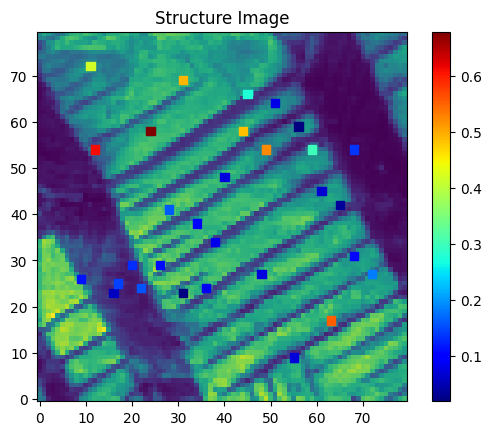

In [ ]:
plt.imshow(struc_img, origin = "lower")
a=plt.scatter(train_indices[:, 0], train_indices[:, 1], c=train_y, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Structure Image')
#plt.axis("off")
plt.show()

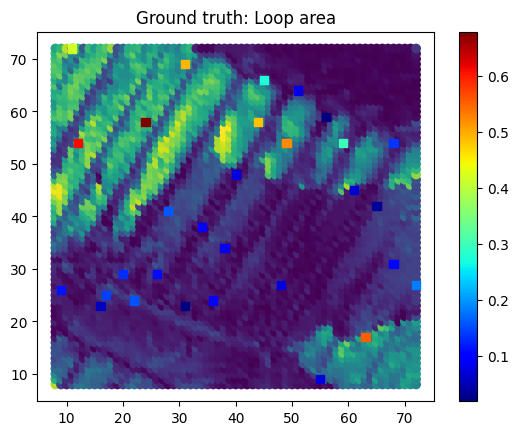

In [ ]:
plt.scatter(indices_all[:, 0], indices_all[:, 1], c=loop_areas_all)
a=plt.scatter(train_indices[:, 0], train_indices[:, 1], c=train_y, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Ground truth: Loop area')
#plt.axis("off")
plt.show()

#Prepare training data

In [ ]:
X_measured = train_x
y_measured = train_y
indices_measured = train_indices
indices_measured_norm = train_indices_norm
X_measured.shape, y_measured.shape, indices_measured.shape, indices_measured_norm.shape

((30, 256), (30,), (30, 2), (30, 2))

In [ ]:
X_unmeasured = np.delete(X, train_idx, 0)
y_unmeasured = np.delete(y, train_idx, 0)
indices_unmeasured = np.delete(indices_all, train_idx, 0)
indices_unmeasured_norm = np.delete(indices_all_norm, train_idx, 0)
X_unmeasured.shape, y_unmeasured.shape, indices_unmeasured.shape, indices_unmeasured_norm.shape

((4195, 256), (4195,), (4195, 2), (4195, 2))

# User votes the quality of the initial sampled spectral

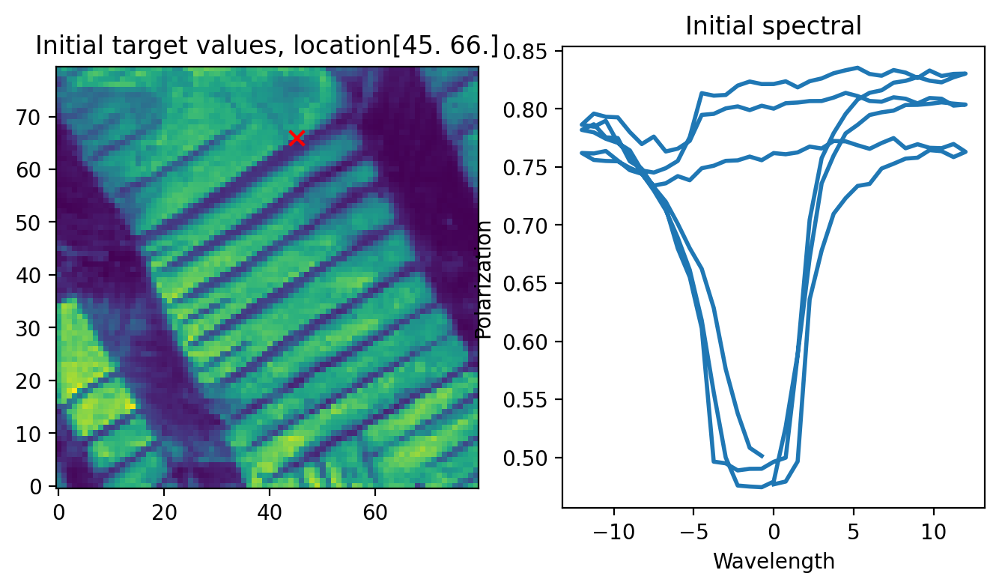

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


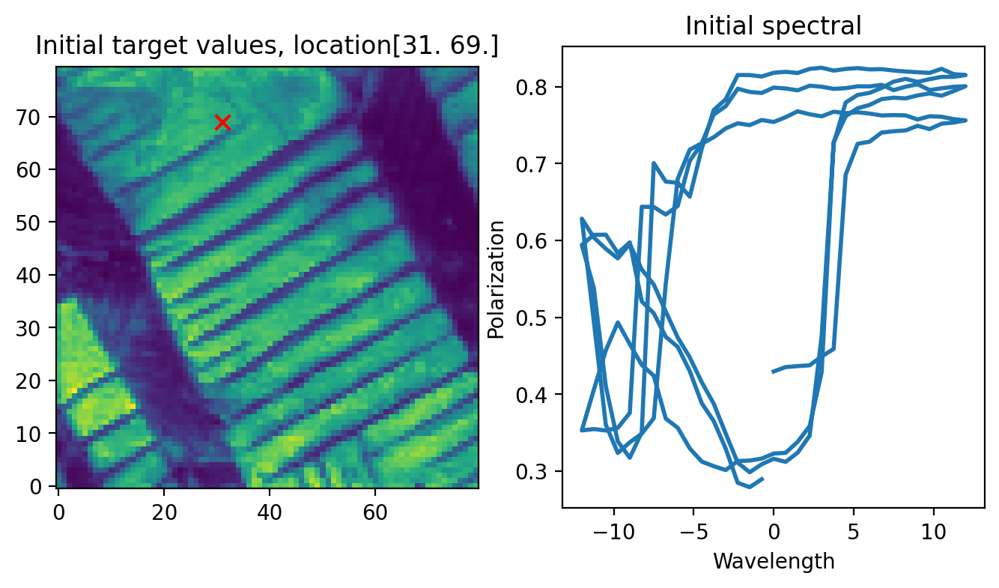

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


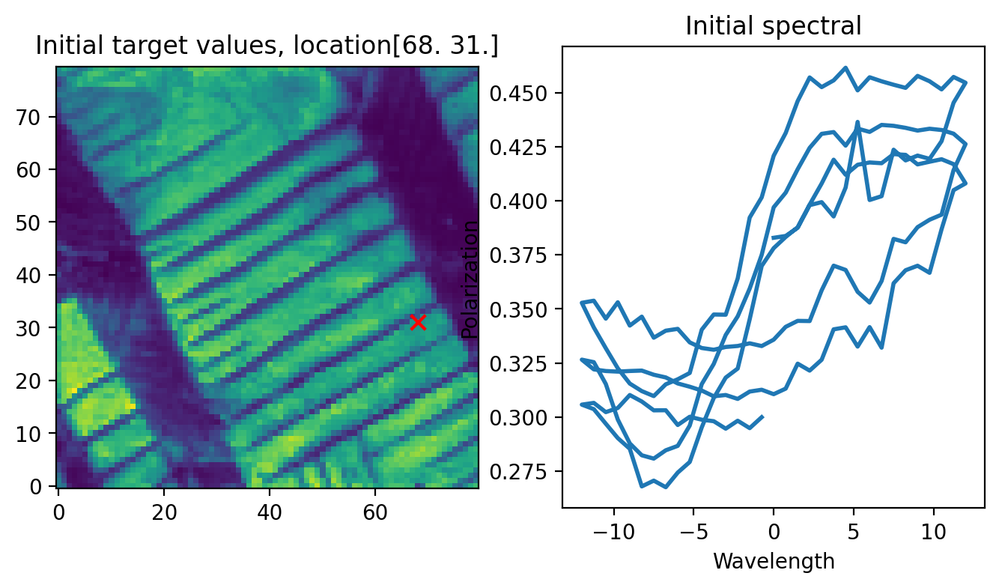

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


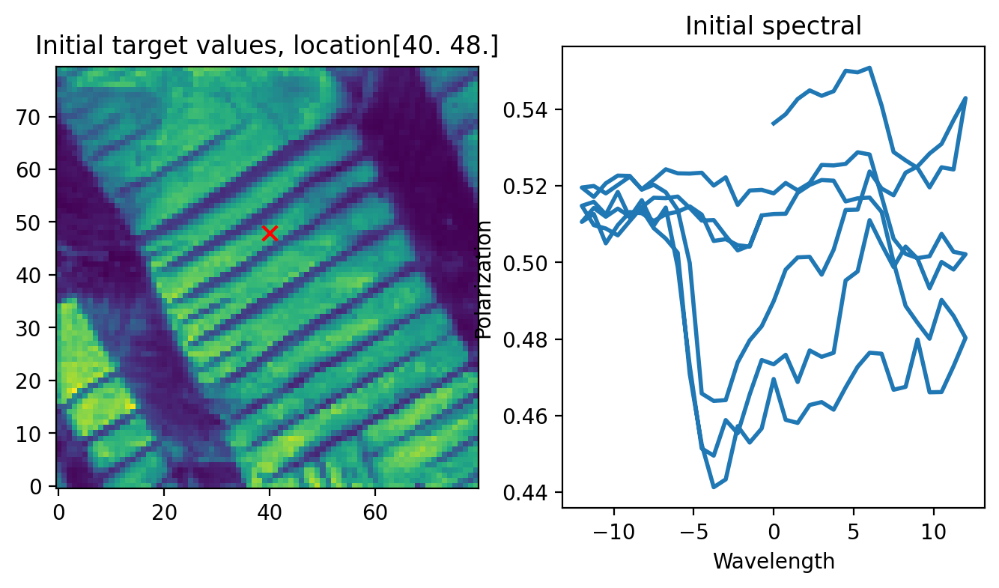

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


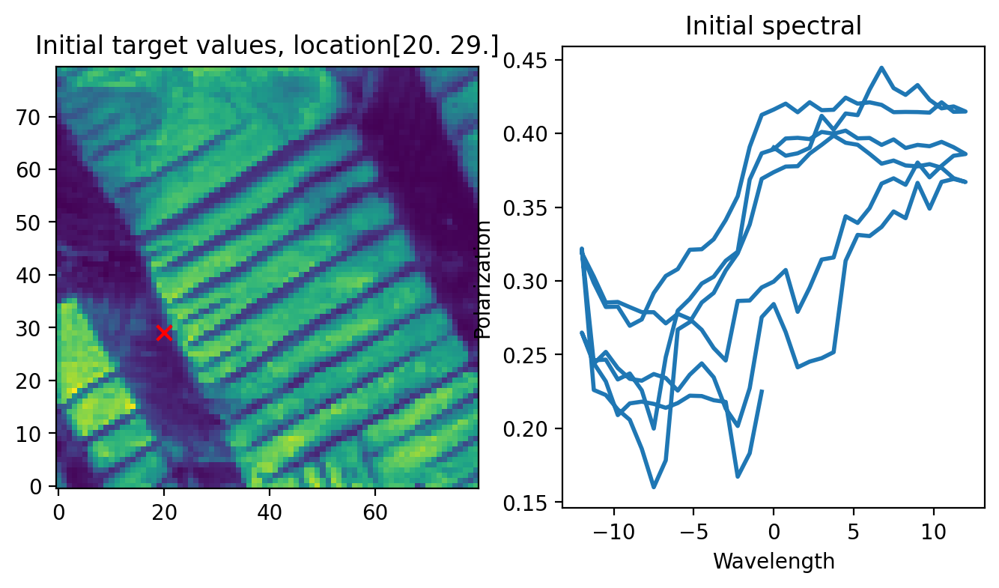

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


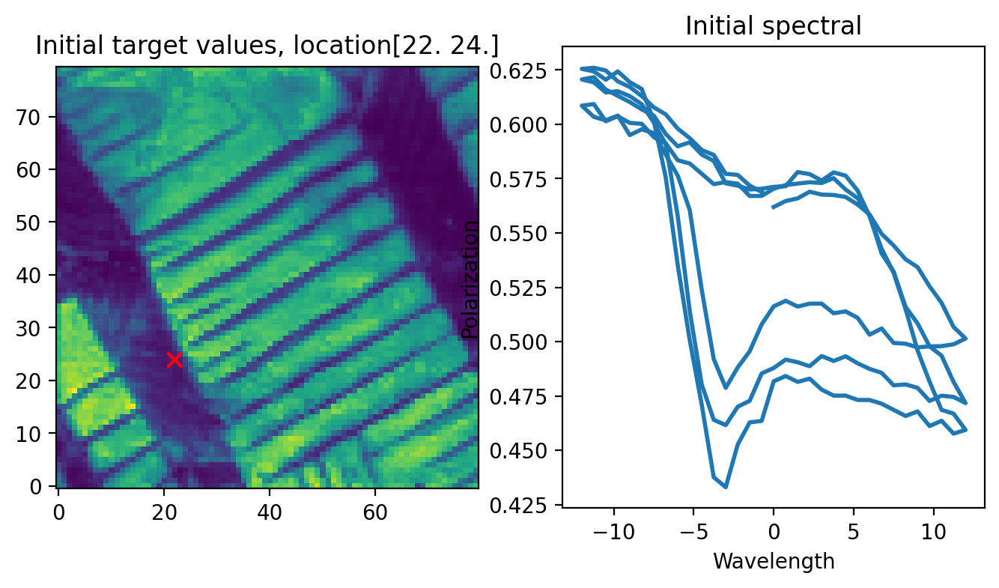

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


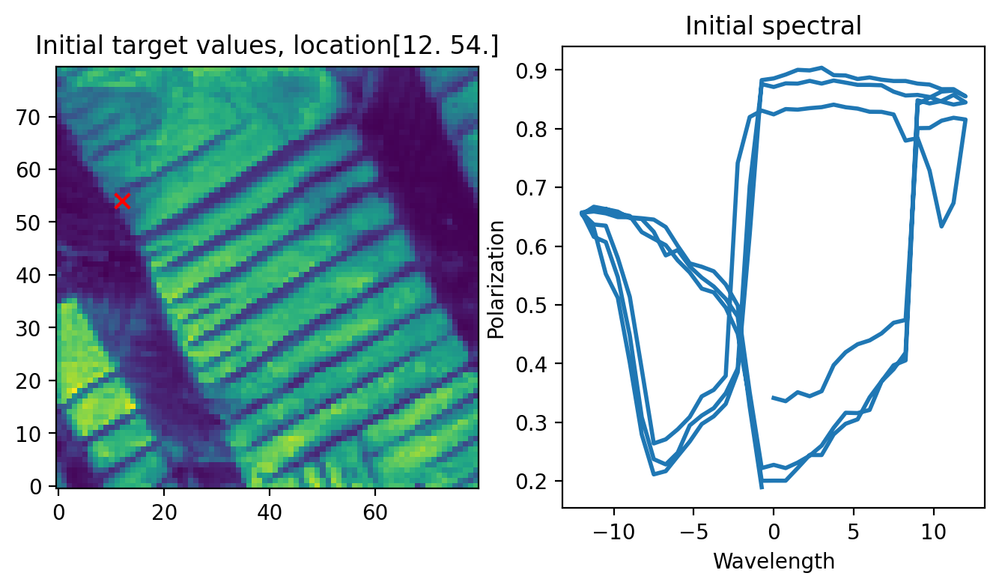

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


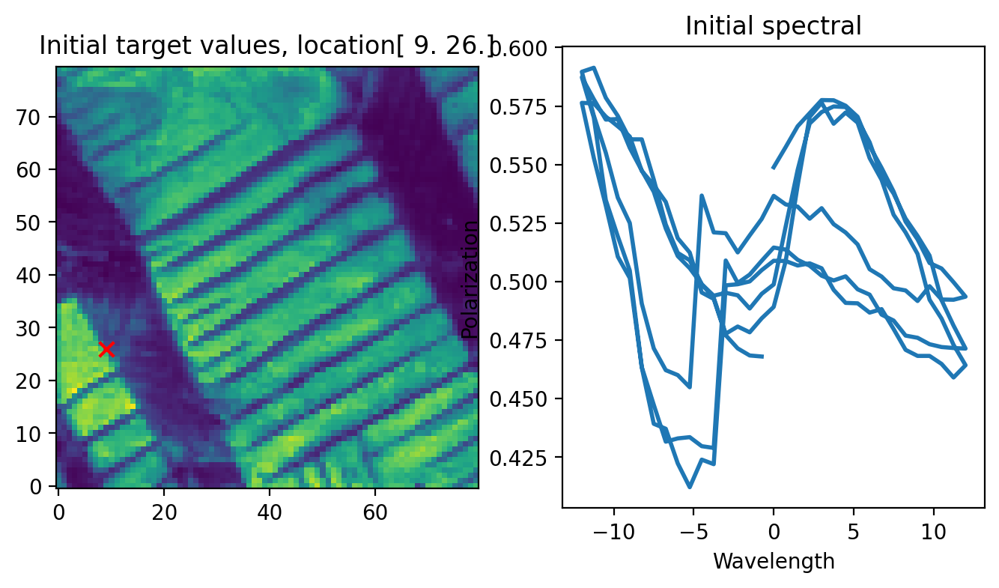

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


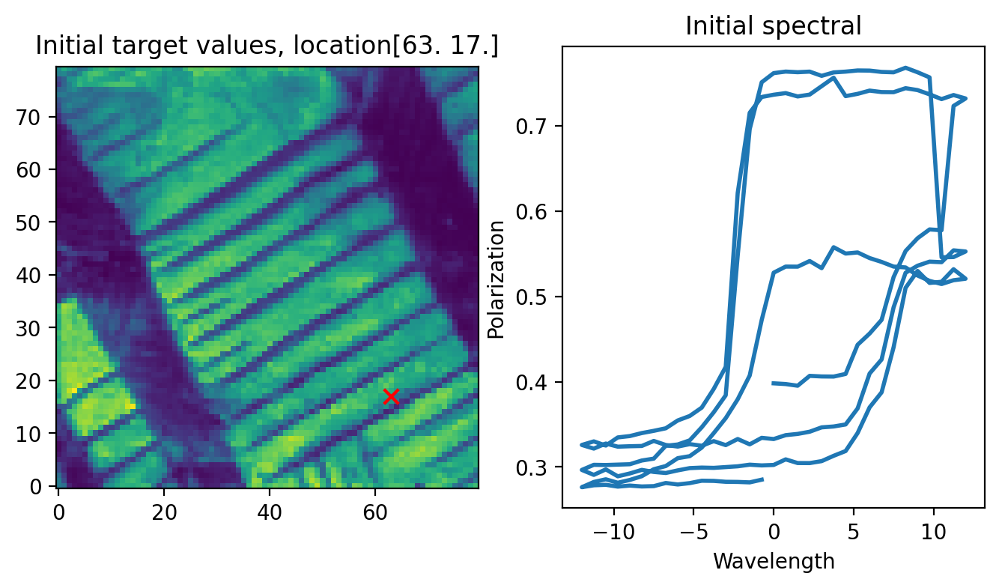

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


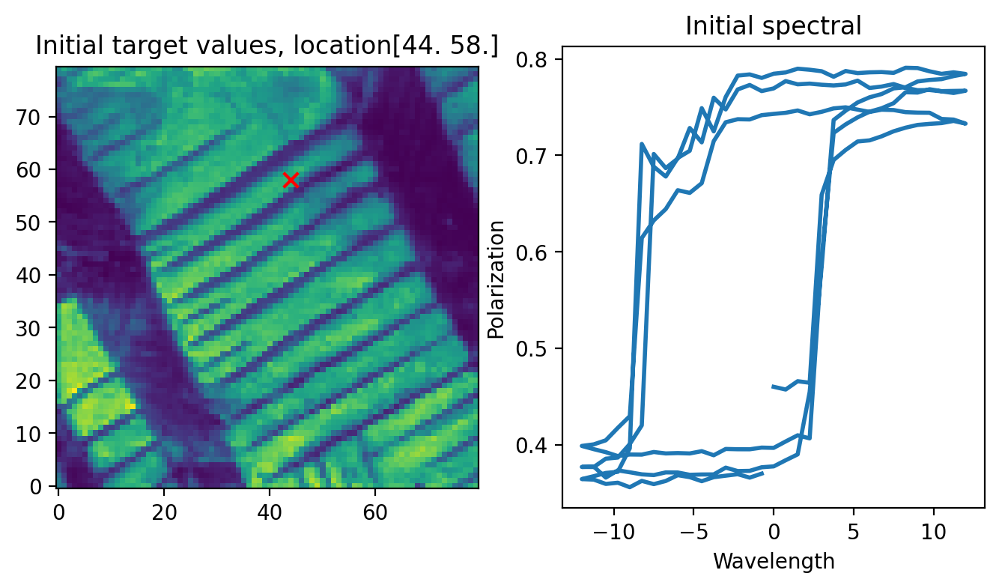

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


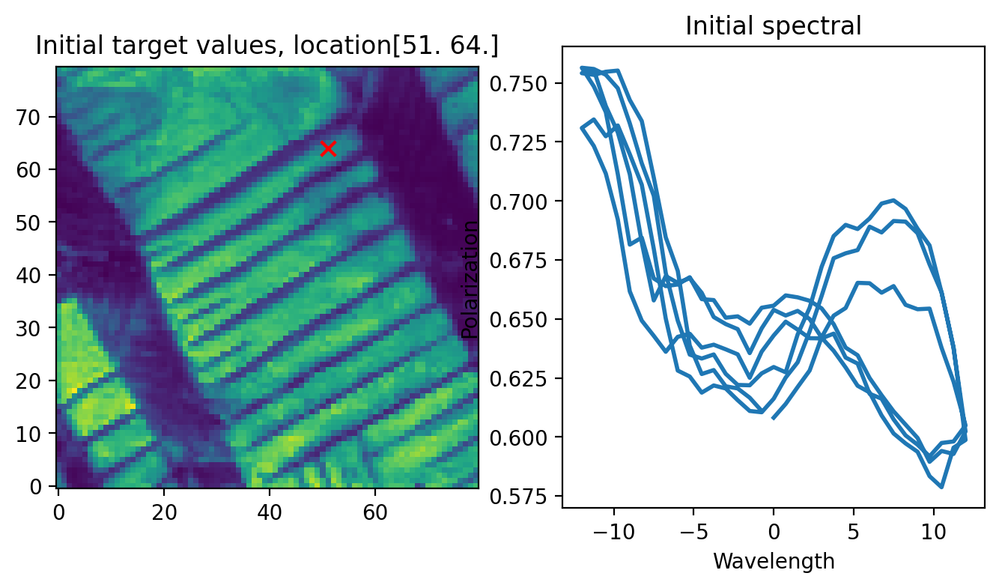

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


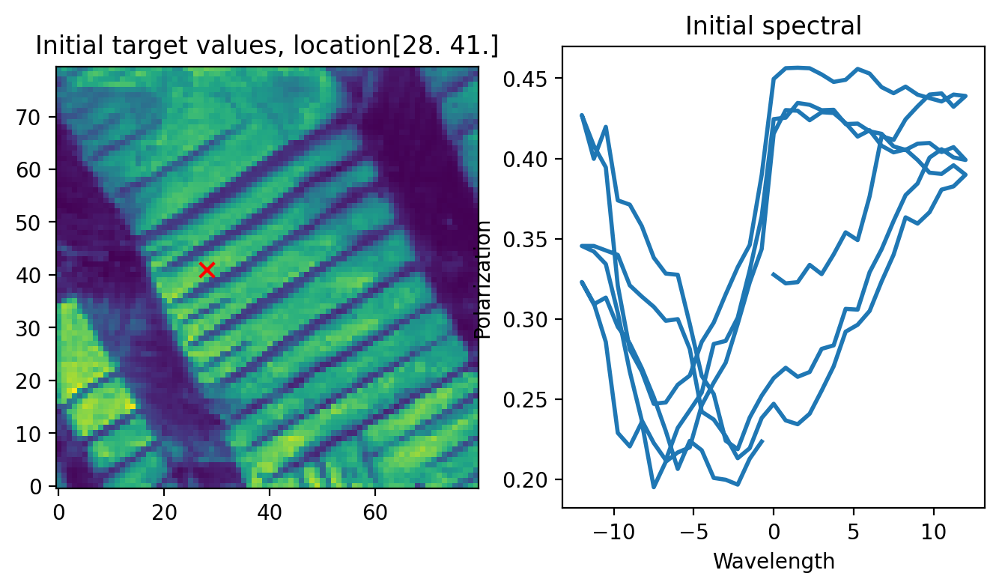

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


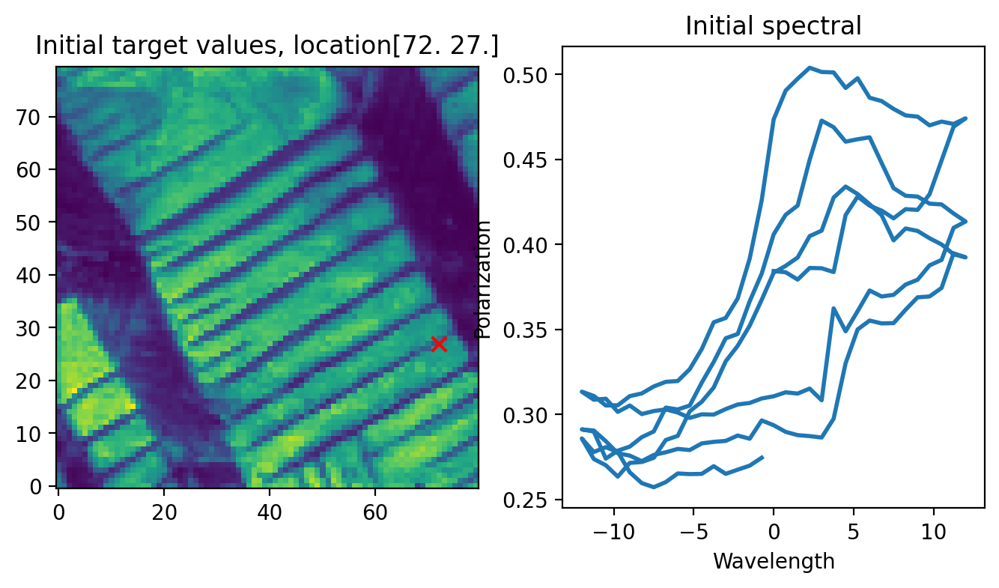

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


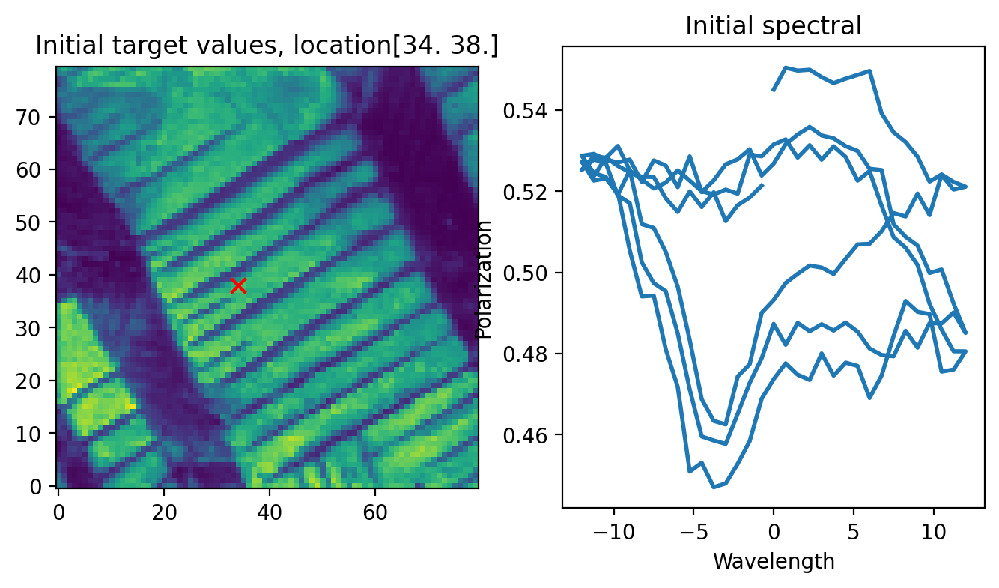

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


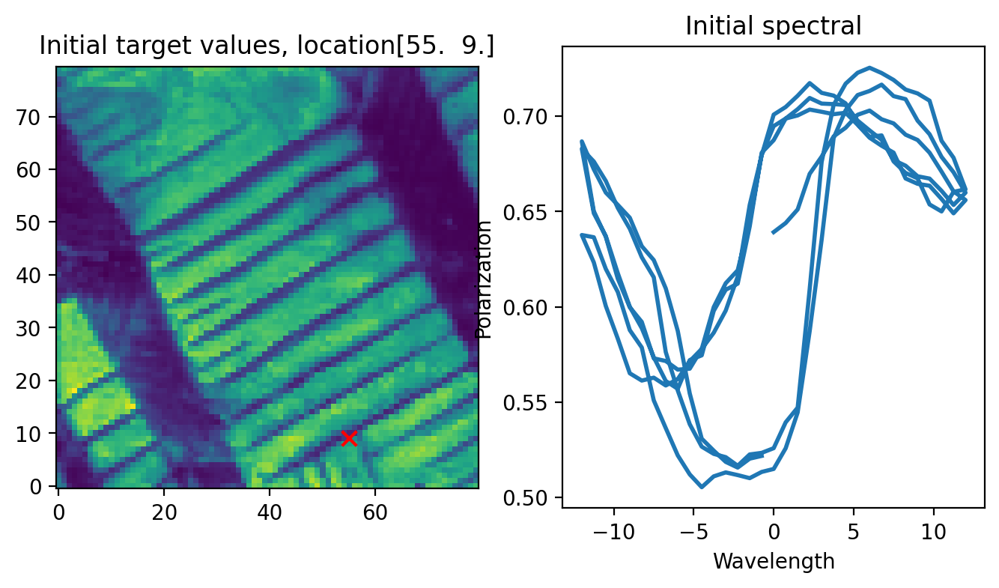

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


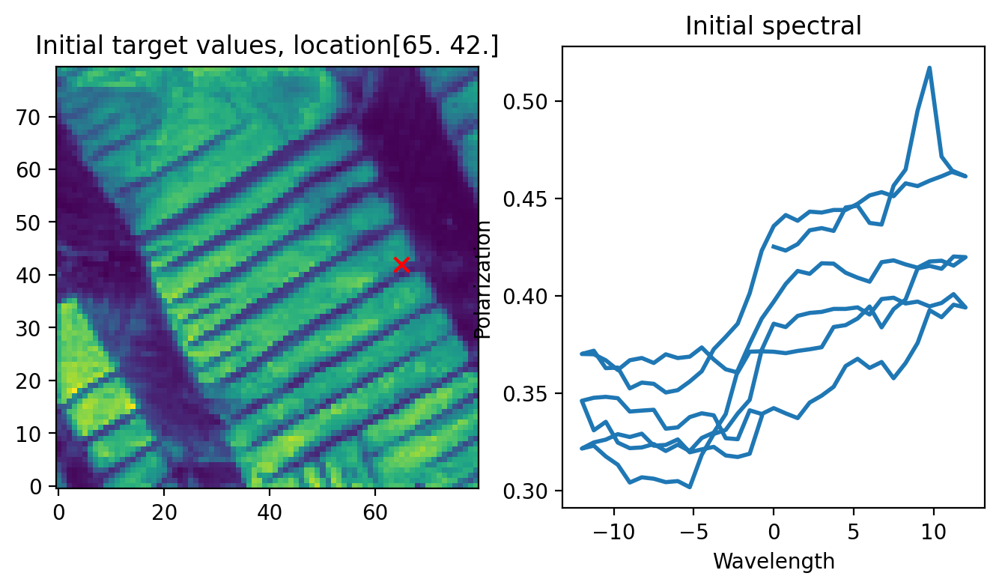

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


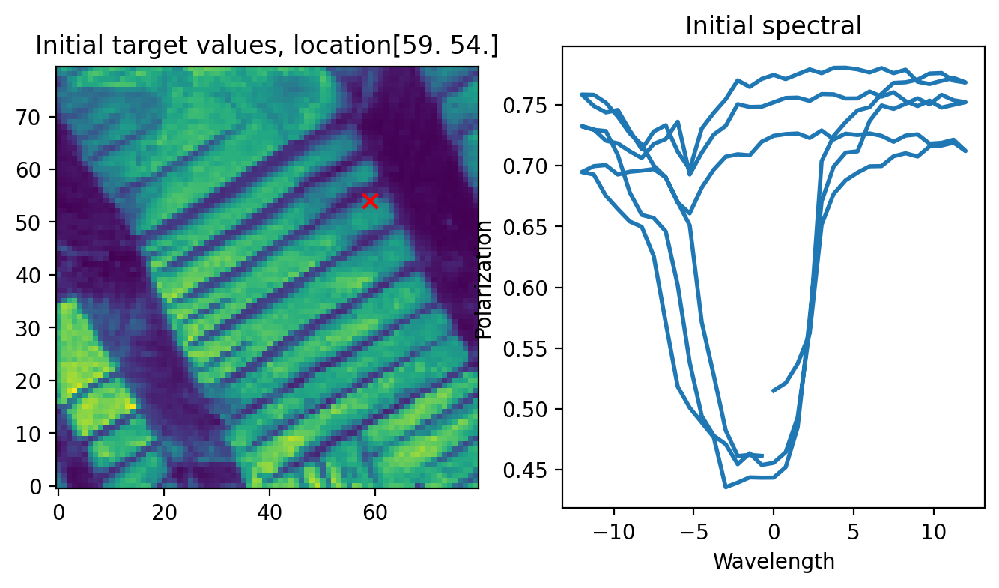

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


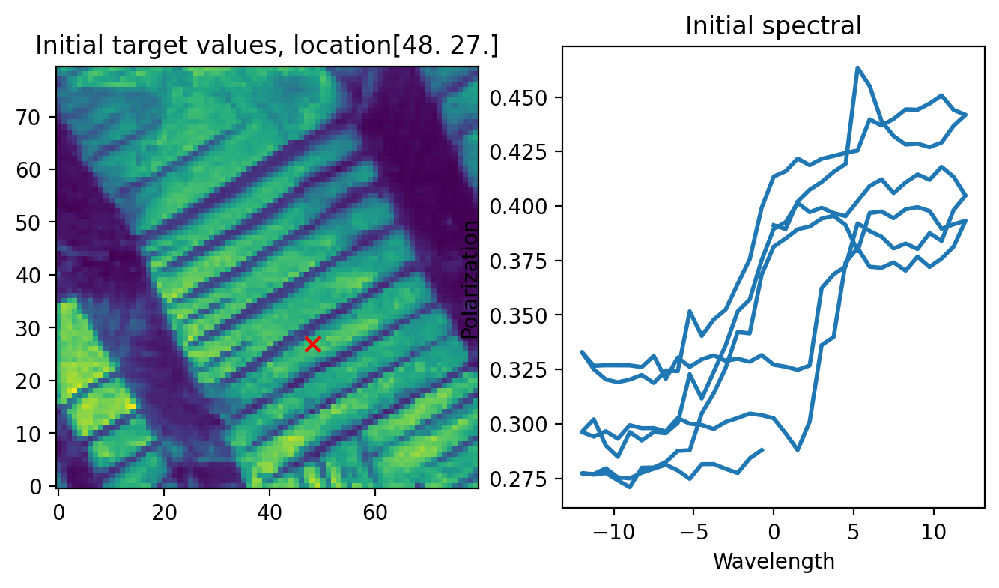

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


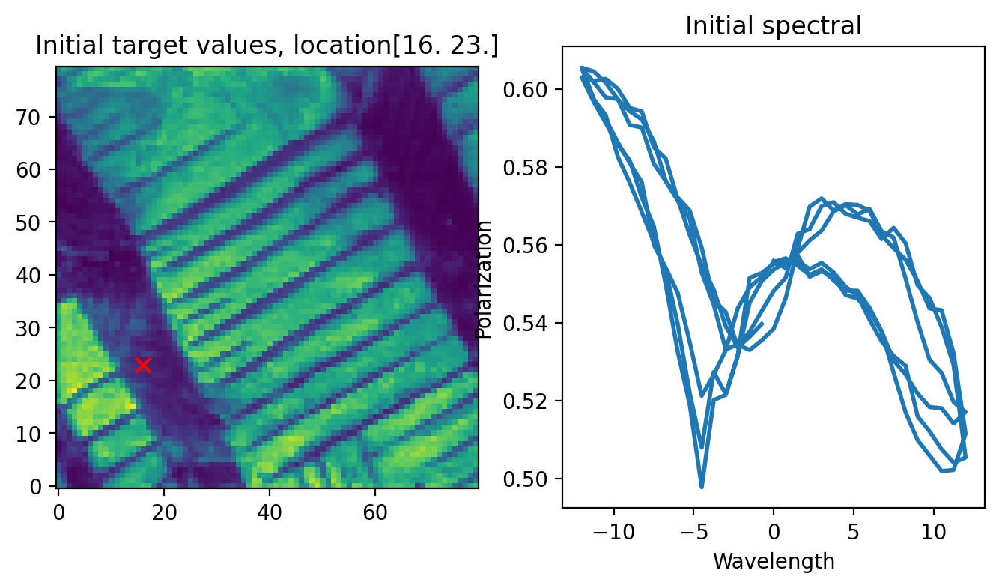

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


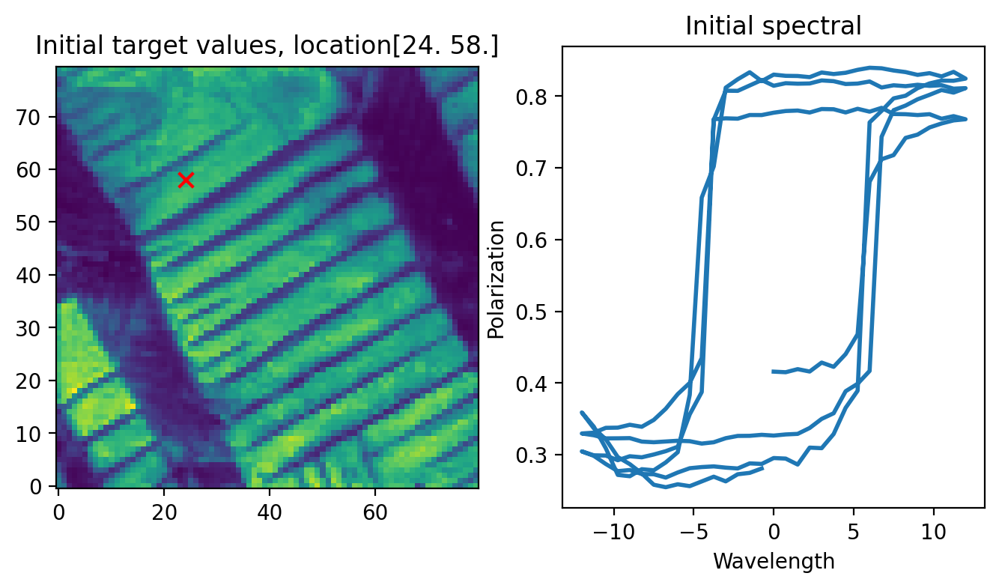

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


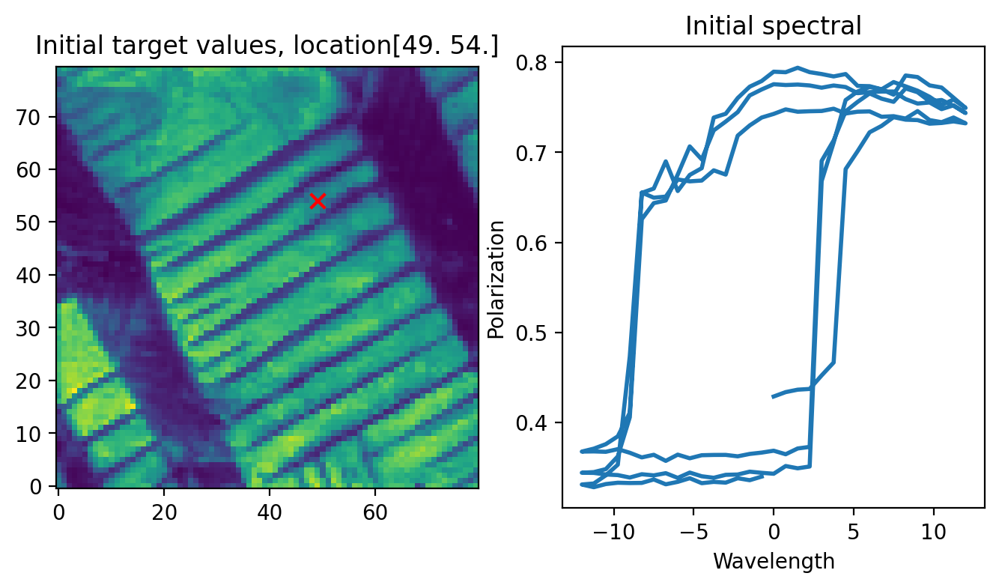

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


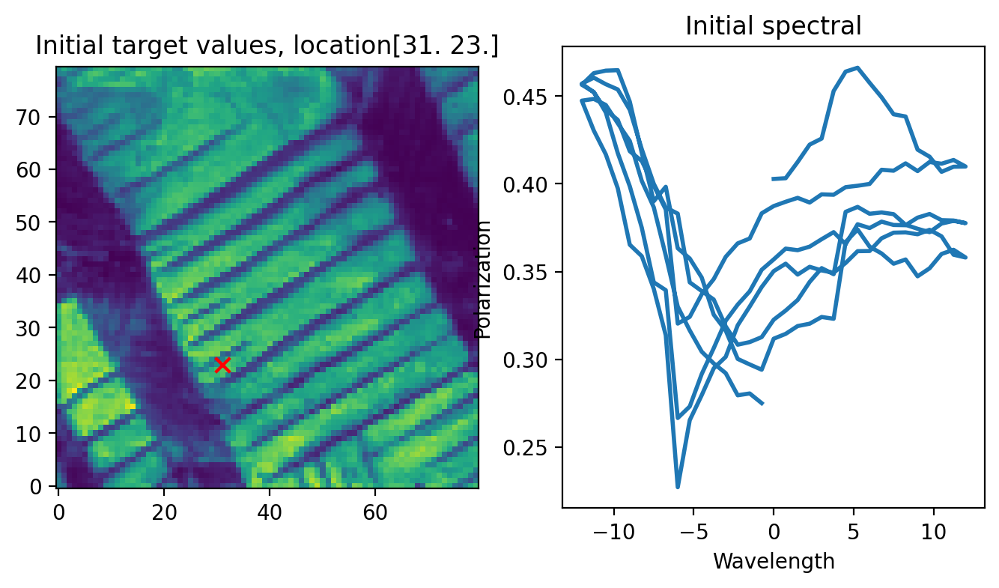

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


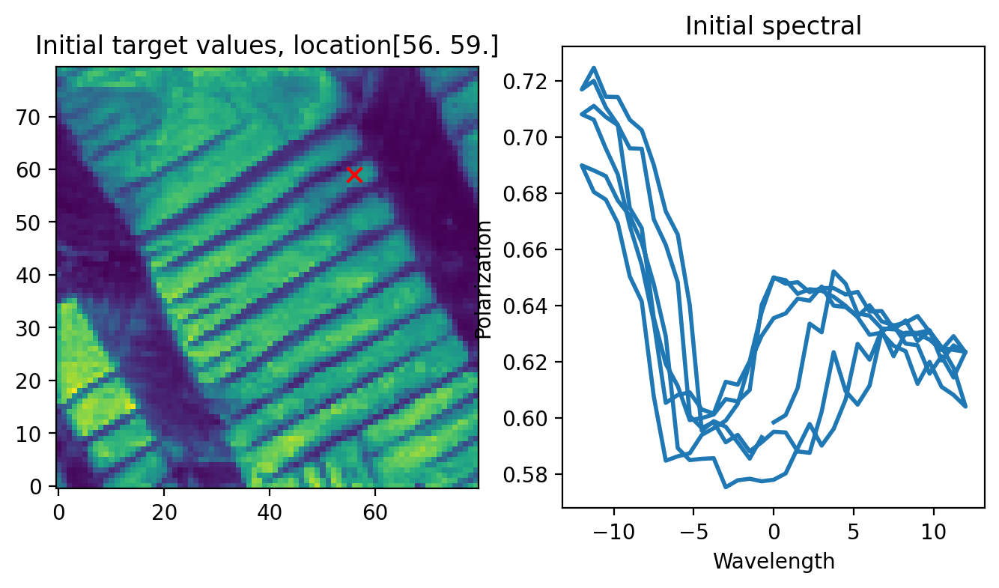

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


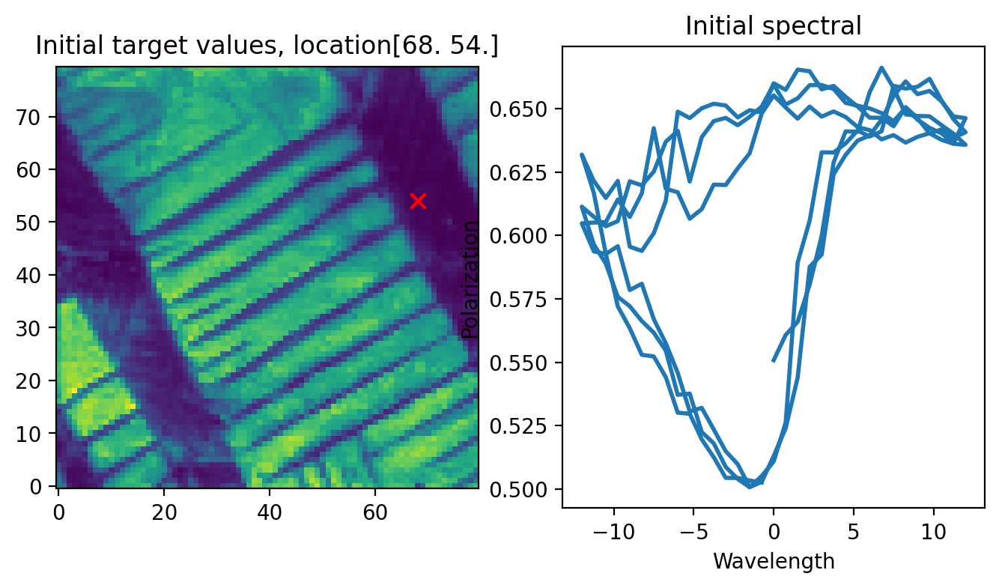

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


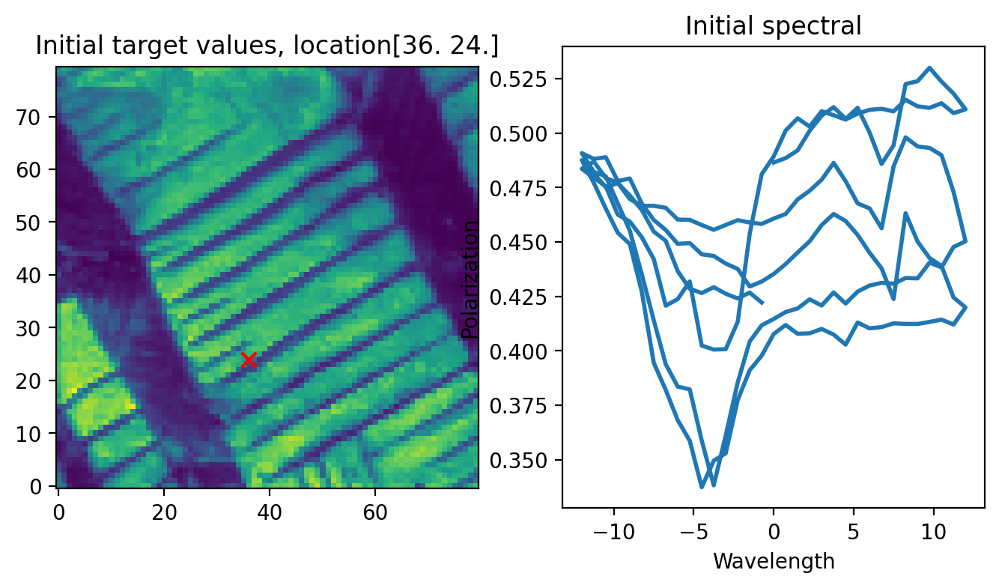

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


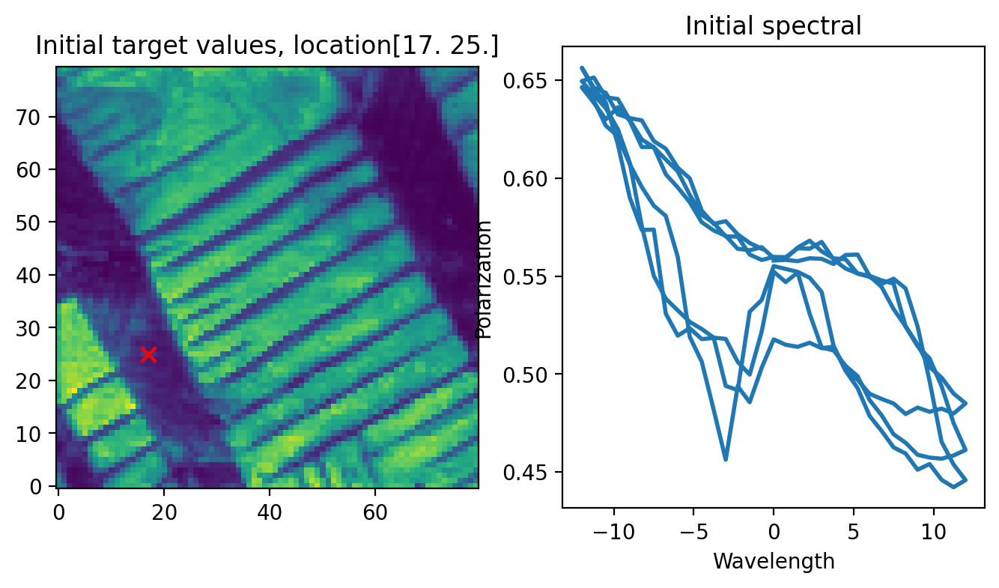

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


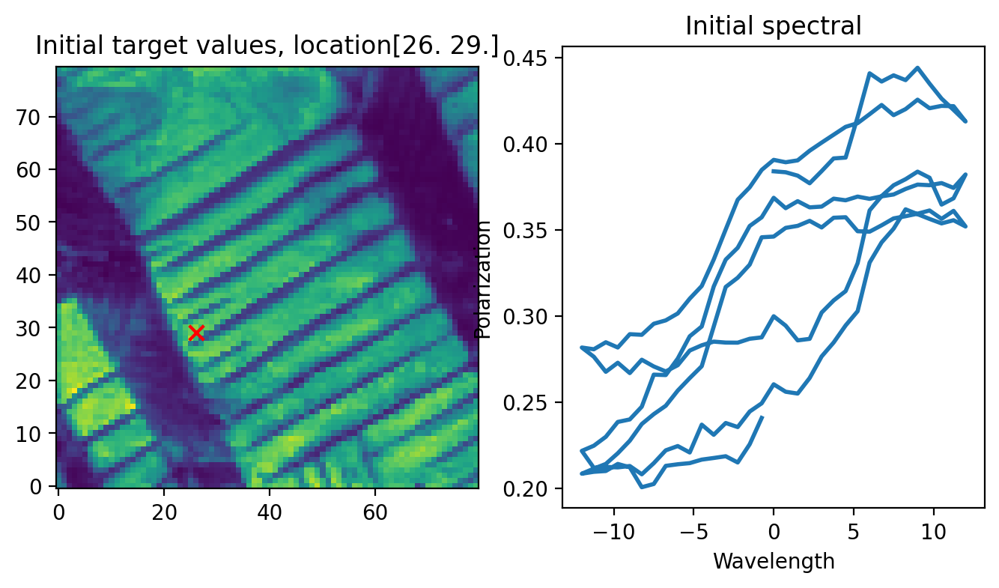

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


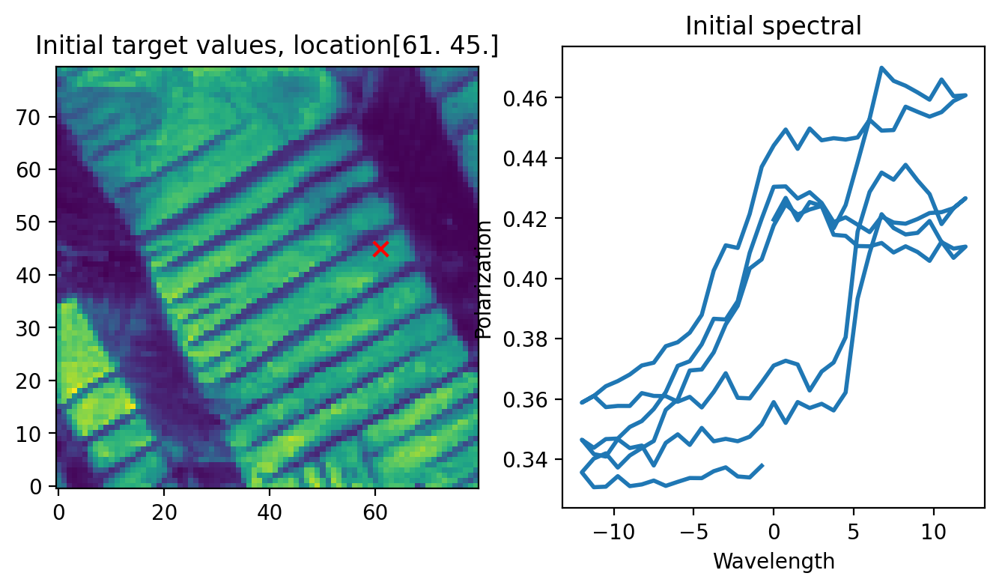

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


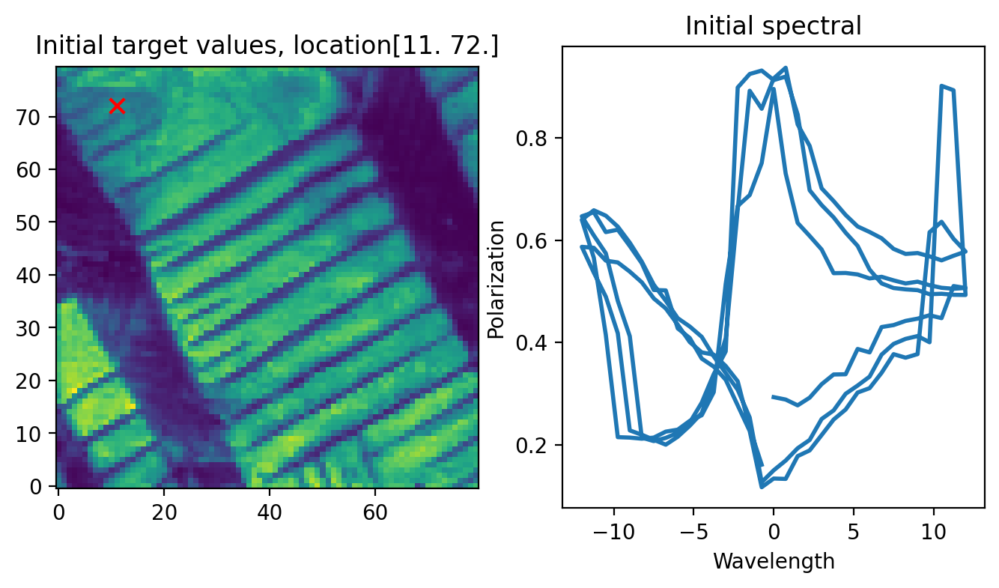

Is the current spectral good? y- Yes or press ENTER- No
Answer: 


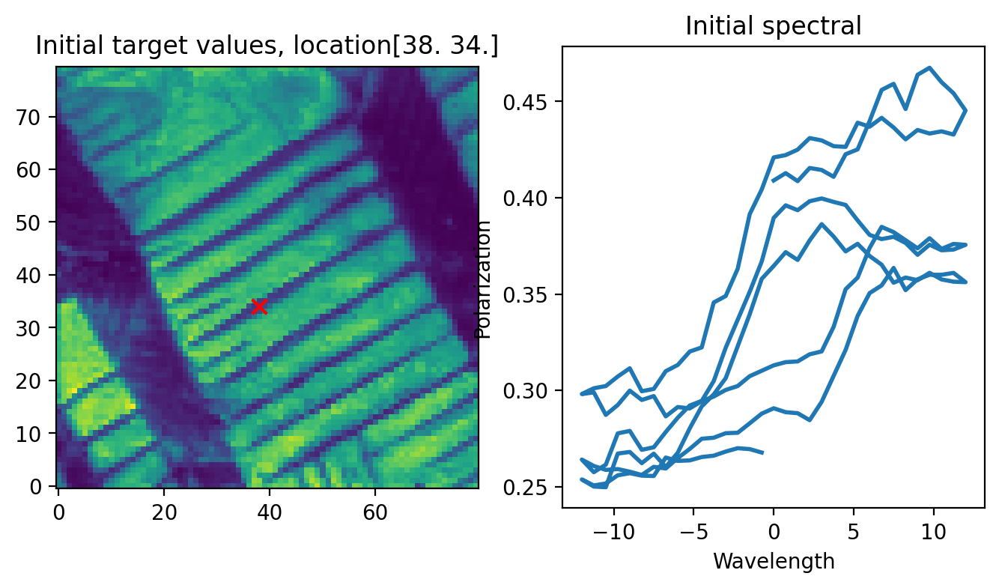

Is the current spectral good? y- Yes or press ENTER- No
Answer: y


(array([1556, 3923,  306, 3584, 2390, 1333, 4179, 3056, 2619, 1090, 2711,
        1191, 3482, 1976]),
 array([2463, 2120,  801,  926,   83, 2851, 1720, 3739, 3361,  535, 1510,
        3171, 3946, 1836,  602,  259]))

In [ ]:
pol_data = [v_step, spectra]
idx_good, idx_bad = votes_initialdata(struc_img, indices_measured, pol_data, train_idx)
idx_good, idx_bad

# Transform votes to distance metric to unknown good and bad regions

In [ ]:
y_vote = np.zeros(len(y_measured))
for i in range(0, len(y_vote)):
    y_good = 0
    y_bad = 0
    for j1 in range(0, len(idx_good)):
      y_good = y_good + np.absolute(indices_measured[i, 0] -  indices_all[idx_good[j1], 0]) + np.absolute(indices_measured[i, 1] -  indices_all[idx_good[j1], 1])
    y_good = y_good/len(idx_good)
    #print(y_good)

    for j2 in range(0, len(idx_bad)):
      y_bad = y_bad + np.absolute(indices_measured[i, 0] -  indices_all[idx_bad[j2], 0]) + np.absolute(indices_measured[i, 1] -  indices_all[idx_bad[j2], 1])
    y_bad = y_bad/len(idx_bad)
    #print(y_bad)

    y_vote[i] = y_bad - y_good # Turning into maximization problem


print(idx_good, idx_bad, y_vote)

[1556 3923  306 3584 2390 1333 4179 3056 2619 1090 2711 1191 3482 1976] [2463 2120  801  926   83 2851 1720 3739 3361  535 1510 3171 3946 1836
  602  259] [  0.66964286  -3.50892857   8.63392857   1.08035714  -4.8125
  -5.22321429  -7.5625      -7.86607143   8.13392857   2.15178571
   2.41964286  -1.1875       8.52678571  -0.16964286   7.61607143
   7.5625       5.74107143   4.47321429  -7.45535714  -3.9375
   4.04464286  -1.86607143   4.50892857   7.29464286  -0.84821429
  -7.04464286  -1.70535714   7.08035714 -10.15178571   1.72321429]


Fit the dKL to define the constrained map where input is the high D struture image patches and the output is the human assessed sprectra quality

In [ ]:
cGP, constraint_mean, _= run_constraindkl(X_measured, y_vote, X)

100%|██████████| 1000/1000 [00:01<00:00, 506.10it/s, init loss: 20471.8333, avg. loss [951-1000]: 19137.0995]



Inferred GP kernel parameters
k_length         [0.3647 0.3411]
k_scale          8.554
noise            1.5792000000000002


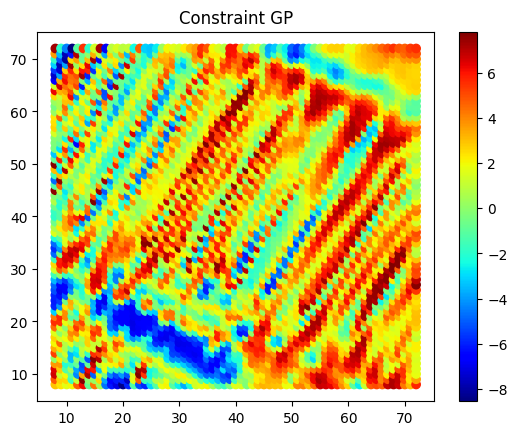

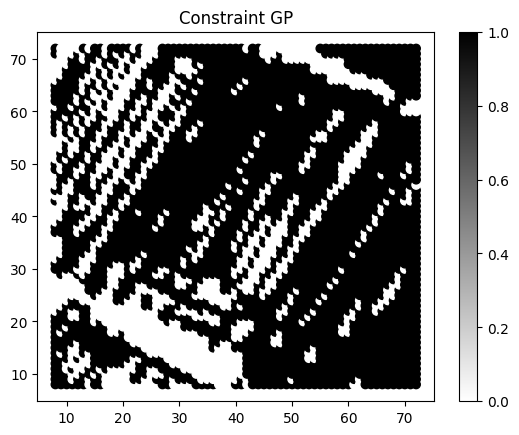

In [ ]:
plt.scatter(indices_all[:, 0], indices_all[:, 1], c=constraint_mean, cmap="jet", alpha =1)
plt.colorbar()
plt.title('Constraint GP')
plt.show()

c_m = np.zeros_like((constraint_mean))
for i in range(0, len(constraint_mean)):
  if constraint_mean[i] < 0:
    c_m[i] = 0
  else:
    c_m[i] = 1

plt.scatter(indices_all[:, 0], indices_all[:, 1], c=c_m, cmap="binary", alpha =1)
#plt.imshow(c_m.reshape((65,65)), origin = 'lower')
plt.colorbar()
plt.title('Constraint GP')
plt.show()

Dark area are the estimated feasible areas

In [ ]:
y_vote = y_vote[0:30]


In [ ]:
c_loc = 1
c_glo = 1

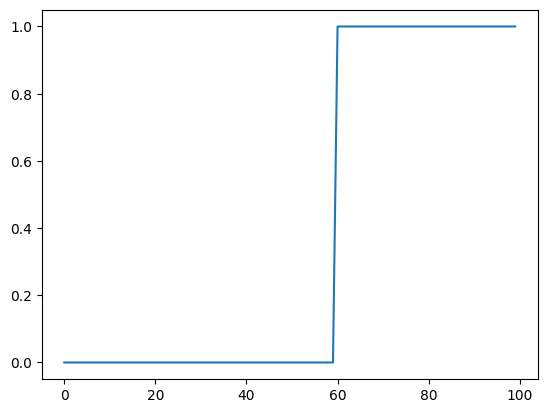

In [ ]:
k = np.zeros(100)
k[60:] = k[60:] + 1
plt.plot(k)

# Case 1: Run Strategic BO
- No constraint

In [ ]:
N = 100 # Number of iterations
n = 5 # Check for best results
m = 0

# Get random number generator keys for training and prediction
rng_key, rng_key_predict = gpax.utils.get_keys(1)
idx = []
best_x = indices_measured[np.argmax(y_measured)]
best_x_norm = indices_measured_norm[np.argmax(y_measured)]
exp_x = [int(np.argmax(y_measured))]
cost = np.zeros((N, 2))
for i in range(1, N+1):
    print("Step:"+str(i))
    # Checking criteria wheather we find a potential region of interest to exploit-- can be a local or global optima
    if m == n:
        best_x = indices_measured[exp_x[-1]]
        best_x_norm = indices_measured_norm[exp_x[-1]]
        m = 0

        if np.isin(exp_x, int(np.argmax(y_measured))).any()== True: #New potential region of interest found with low function values

            y_train_norm = (y_measured-np.min(y_measured))/(np.max(y_measured)-np.min(y_measured))
            best_y_norm = np.max(y_train_norm)
            # Need to provide normalized value of X and Y
            print("Checking for ROI with potntial local optima")
            exp_x = check_ROI(indices_measured_norm, y_train_norm, best_x_norm, best_y_norm, exp_x)
            best_x = indices_measured[exp_x[-1]]
            best_x_norm = indices_measured_norm[exp_x[-1]]
        else:
            exp_x = np.hstack((exp_x, int(np.argmax(y_measured)))) #New potential ROI found with higher function values
            best_x = indices_measured[exp_x[-1]]
            best_x_norm = indices_measured_norm[exp_x[-1]]
            print("New ROI with potential global optima found")

    m = m + 1


    # Execute dKL
    print("Running GP for function evaluation")
    X_unmeasured_norm = (X_unmeasured-np.min(X_unmeasured))/(np.max(X_unmeasured)-np.min(X_unmeasured))
    test_data = [X_unmeasured, X_unmeasured_norm, indices_unmeasured]
    cost_params = [best_x, exp_x, c_loc, c_glo, int(k[i-1])]
    #constraint_mean_norm = (constraint_mean-np.min(constraint_mean))/(np.max(constraint_mean)-np.min(constraint_mean))

    gpbo, obj, y_pred, y_var = run_statdKL(X_measured, y_measured, indices_measured, test_data, constraint = None, cost_params= cost_params)

    # Select next point to "measure"
    next_point_idx = obj.argmax()
    # Do "measurement"
    measured_point = y_unmeasured[next_point_idx]
    # Plot current result
    if ((i == 1) or ((i % 15) == 0)): # Check predictions after every 10 BO runs
      fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
      ax[0, 0].imshow(struc_img, origin = "lower")
      a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 0].set_title("Structure Image")

      a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
      ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 1].set_title("Ground Truth")

      #b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
      b= ax[1, 0].scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=y_pred)
      ax[1, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured)
      plt.colorbar(b, orientation='vertical')
      ax[1, 0].set_xlabel("x1")
      ax[1, 0].set_ylabel("x2")
      ax[1, 0].set_title("GPmean")

      #b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
      b= ax[1, 1].scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=y_var)
      #ax[1, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured)
      plt.colorbar(b, orientation='vertical')
      ax[1, 1].set_xlabel("x1")
      ax[1, 1].set_ylabel("x2")
      ax[1, 1].set_title("GPvar")
      plt.show()

    plot_result(indices_unmeasured, obj, pol_data)
    #np.savez("singleDKL_step{}.npz".format(e), next_point_idx = next_point_idx, obj = obj, X_measured = X_measured,
    #         X_unmeasured = X_unmeasured, y_measured = y_measured, y_unmeasured = y_unmeasured,
    #         indices_measured = indices_measured, indices_unmeasured = indices_unmeasured)
    # Update the arrays of measured/unmeasured points
    X_measured = np.append(X_measured, X_unmeasured[next_point_idx][None], 0)
    X_unmeasured = np.delete(X_unmeasured, next_point_idx, 0)
    y_measured = np.append(y_measured, measured_point)
    y_unmeasured = np.delete(y_unmeasured, next_point_idx)
    indices_measured = np.append(indices_measured, indices_unmeasured[next_point_idx][None], 0)
    indices_unmeasured = np.delete(indices_unmeasured, next_point_idx, 0)
    indices_measured_norm = np.append(indices_measured_norm, indices_unmeasured_norm[next_point_idx][None], 0)
    indices_unmeasured_norm = np.delete(indices_unmeasured_norm, next_point_idx, 0)





Final prediction and validation

In [ ]:
rng_key, rng_key_predict = gpax.utils.get_keys(1)
data_dim = X.shape[-1]
# update posterior
dkl = gpax.viDKL(data_dim, 2, kernel='Matern')
dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
    rng_key, X_measured, y_measured, num_steps=1000, step_size=0.005)
y_pred, y_var = dkl.predict(rng_key_predict, X)

100%|██████████| 1000/1000 [00:31<00:00, 31.65it/s, init loss: 20289.0339, avg. loss [951-1000]: 18932.5817]



Inferred GP kernel parameters
k_length         [0.4235 0.4364]
k_scale          0.43720000000000003
noise            0.011600000000000001


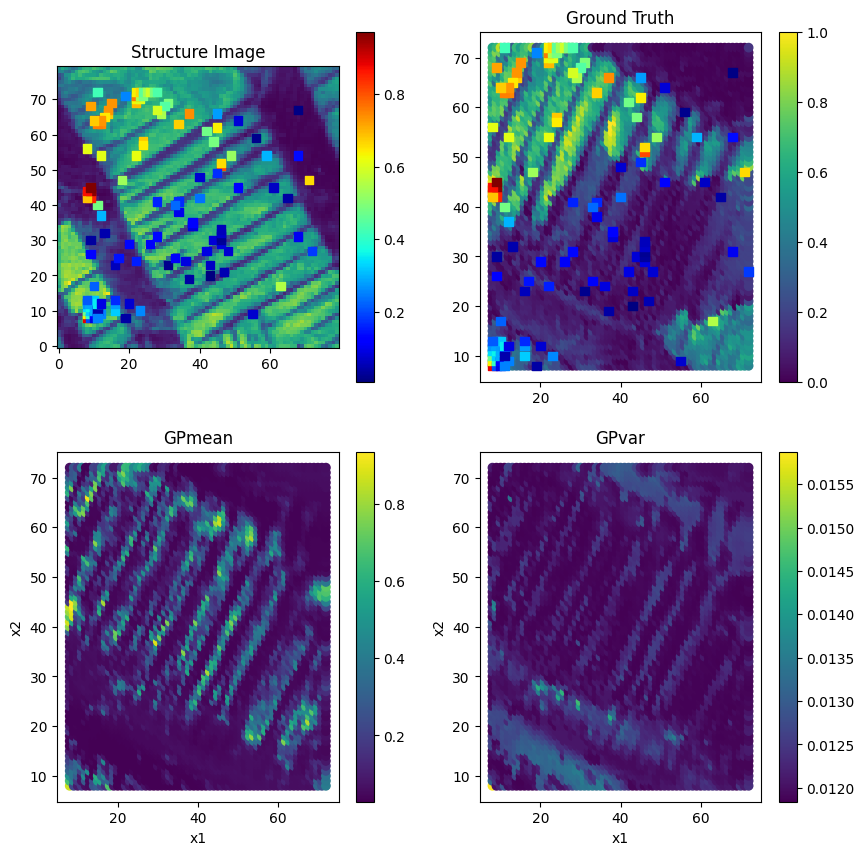

In [ ]:
fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
ax[0, 0].imshow(struc_img, origin = "lower")
a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 0].set_title("Structure Image")

a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 1].set_title("Ground Truth")

#b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
b= ax[1, 0].scatter(indices_all[:, 0], indices_all[:, 1], c=y_pred)
plt.colorbar(b, orientation='vertical')
ax[1, 0].set_xlabel("x1")
ax[1, 0].set_ylabel("x2")
ax[1, 0].set_title("GPmean")

#b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
b= ax[1, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y_var)
plt.colorbar(b, orientation='vertical')
ax[1, 1].set_xlabel("x1")
ax[1, 1].set_ylabel("x2")
ax[1, 1].set_title("GPvar")
plt.show()

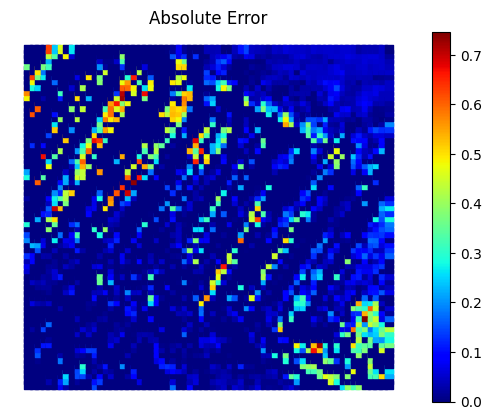

Mean error: 0.060492050619706056


In [ ]:

a=plt.scatter(indices_all[:, 0], indices_all[:, 1], c=np.abs(y-y_pred)*c_m_SANE_dc, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Absolute Error')
plt.axis("off")
plt.show()
print("Mean error: "+str(np.mean(np.abs(y-y_pred)*c_m_SANE_dc)))

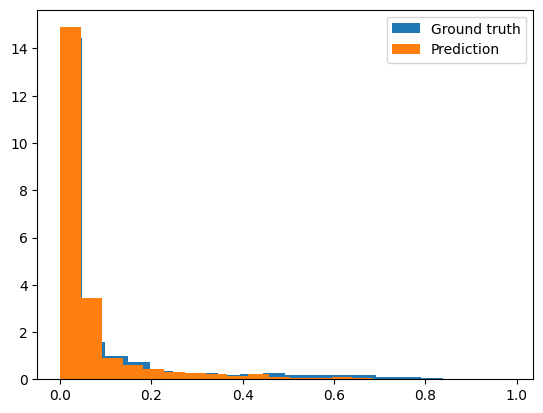

In [ ]:
plt.hist(y*c_m_SANE_dc, bins=20, density=True, label="Ground truth")
plt.hist(y_pred*c_m_SANE_dc, bins=20, density=True, label="Prediction")
plt.legend()
plt.show()

In [ ]:
hist1, _ = np.histogram(y*c_m_SANE_dc, bins=20, density=True)
hist2, _ = np.histogram(y_pred*c_m_SANE_dc, bins=20, density=True)
minima = np.minimum(hist1, hist2)
intersection = np.true_divide(np.sum(minima), np.sum(hist2))
intersection

0.8846056337064231

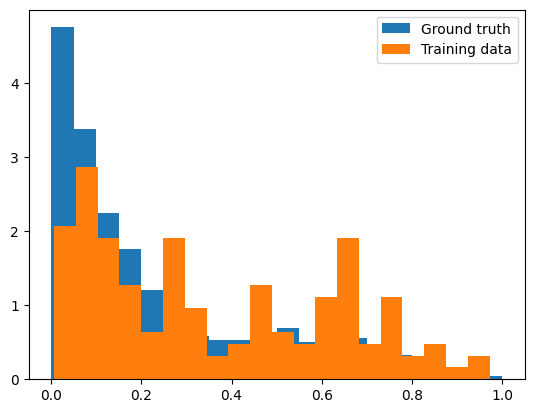

In [ ]:
plt.hist(y, bins=20, density=True, label="Ground truth")
#plt.hist(y*c_m, bins=20, density=True, label="Ground truth with constraint")
plt.hist(y_measured, bins=20, density=True, label="Training data")
plt.legend()
plt.show()

In [ ]:
y_pred_SANE_nc = y_pred
y_measured_SANE_nc = y_measured
np.save("y_pred_SANE_nc.npy", y_pred_SANE_nc)
np.save("y_measured_SANE_nc.npy", y_measured_SANE_nc)

# Case 2:Run Strategic BO
- Fixed constraint estimated from initial voting only
- Constraint penalty = $1000$

In [ ]:
X_measured = train_x
y_measured = train_y
indices_measured = train_indices
indices_measured_norm = train_indices_norm
X_measured.shape, y_measured.shape, indices_measured.shape, indices_measured_norm.shape

((30, 256), (30,), (30, 2), (30, 2))

In [ ]:
X_unmeasured = np.delete(X, train_idx, 0)
y_unmeasured = np.delete(y, train_idx, 0)
indices_unmeasured = np.delete(indices_all, train_idx, 0)
indices_unmeasured_norm = np.delete(indices_all_norm, train_idx, 0)
X_unmeasured.shape, y_unmeasured.shape, indices_unmeasured.shape, indices_unmeasured_norm.shape

((4195, 256), (4195,), (4195, 2), (4195, 2))

In [ ]:
y_vote = y_vote[0:30]

In [ ]:
N = 100 # Number of iterations
n = 5 # Check for best results
m = 0

# Get random number generator keys for training and prediction
rng_key, rng_key_predict = gpax.utils.get_keys(1)
idx = []
best_x = indices_measured[np.argmax(y_measured)]
best_x_norm = indices_measured_norm[np.argmax(y_measured)]
exp_x = [int(np.argmax(y_measured))]

cost = np.zeros((N, 2))

# Execute contraint dKL
print("Running GP for constraint evaluation")
cGP, constraint_mean, _= run_constraindkl(X_measured, y_vote, X_unmeasured)
#Plot constraint map
c_m = np.zeros_like((constraint_mean))
for j in range(0, len(constraint_mean)):
  if constraint_mean[j] < 0:
    c_m[j] = 0
  else:
    c_m[j] = 1

plt.scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=c_m, cmap="binary", alpha =1)
plt.scatter(indices_all[:, 0], indices_all[:, 1], c=y, cmap="viridis", alpha=0.1)
#plt.imshow(c_m.reshape((65,65)), origin = 'lower')
plt.colorbar()
plt.title('Constraint GP')
plt.show()

for i in range(1, N+1):
    print("Step:"+str(i))
    # Checking criteria wheather we find a potential region of interest to exploit-- can be a local or global optima
    if m == n:
        best_x = indices_measured[exp_x[-1]]
        best_x_norm = indices_measured_norm[exp_x[-1]]
        m = 0

        if np.isin(exp_x, int(np.argmax(y_measured))).any()== True: #New potential region of interest found with low function values

            y_train_norm = (y_measured-np.min(y_measured))/(np.max(y_measured)-np.min(y_measured))
            best_y_norm = np.max(y_train_norm)
            # Need to provide normalized value of X and Y
            print("Checking for ROI with potntial local optima")
            exp_x = check_ROI(indices_measured_norm, y_train_norm, best_x_norm, best_y_norm, exp_x)
            best_x = indices_measured[exp_x[-1]]
            best_x_norm = indices_measured_norm[exp_x[-1]]
        else:
            exp_x = np.hstack((exp_x, int(np.argmax(y_measured)))) #New potential ROI found with higher function values
            best_x = indices_measured[exp_x[-1]]
            best_x_norm = indices_measured_norm[exp_x[-1]]
            print("New ROI with potential global optima found")

    m = m + 1




    # Execute dKL
    print("Running GP for function evaluation")
    X_unmeasured_norm = (X_unmeasured-np.min(X_unmeasured))/(np.max(X_unmeasured)-np.min(X_unmeasured))
    test_data = [X_unmeasured, X_unmeasured_norm, indices_unmeasured]
    cost_params = [best_x, exp_x, c_loc, c_glo, int(k[i-1])]
    #constraint_mean_norm = (constraint_mean-np.min(constraint_mean))/(np.max(constraint_mean)-np.min(constraint_mean))

    gpbo, obj, y_pred, y_var = run_statdKL(X_measured, y_measured, indices_measured, test_data, constraint = constraint_mean, pen=1000, cost_params= cost_params)
    # Select next point to "measure"
    next_point_idx = obj.argmax()
    # Do "measurement"
    measured_point = y_unmeasured[next_point_idx]
    # Plot current result
    if ((i == 1) or ((i % 15) == 0)): # Check predictions after every 10 BO runs
      fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
      ax[0, 0].imshow(struc_img, origin = "lower")
      a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 0].set_title("Structure Image")

      a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
      ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 1].set_title("Ground Truth")

      #b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
      b= ax[1, 0].scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=y_pred)
      ax[1, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured)
      plt.colorbar(b, orientation='vertical')
      ax[1, 0].set_xlabel("x1")
      ax[1, 0].set_ylabel("x2")
      ax[1, 0].set_title("GPmean")

      #b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
      b= ax[1, 1].scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=y_var)
      #ax[1, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured)
      plt.colorbar(b, orientation='vertical')
      ax[1, 1].set_xlabel("x1")
      ax[1, 1].set_ylabel("x2")
      ax[1, 1].set_title("GPvar")
      plt.show()

    plot_result(indices_unmeasured, obj, pol_data)
    #np.savez("singleDKL_step{}.npz".format(e), next_point_idx = next_point_idx, obj = obj, X_measured = X_measured,
    #         X_unmeasured = X_unmeasured, y_measured = y_measured, y_unmeasured = y_unmeasured,
    #         indices_measured = indices_measured, indices_unmeasured = indices_unmeasured)
    # Update the arrays of measured/unmeasured points
    X_measured = np.append(X_measured, X_unmeasured[next_point_idx][None], 0)
    X_unmeasured = np.delete(X_unmeasured, next_point_idx, 0)
    y_measured = np.append(y_measured, measured_point)
    y_unmeasured = np.delete(y_unmeasured, next_point_idx)
    indices_measured = np.append(indices_measured, indices_unmeasured[next_point_idx][None], 0)
    indices_unmeasured = np.delete(indices_unmeasured, next_point_idx, 0)
    indices_measured_norm = np.append(indices_measured_norm, indices_unmeasured_norm[next_point_idx][None], 0)
    indices_unmeasured_norm = np.delete(indices_unmeasured_norm, next_point_idx, 0)
    constraint_mean = np.delete(constraint_mean, next_point_idx, 0)






# Final prediction and Plotting

- Sampled data over fixed Constraint map

In [ ]:
cGP, constraint_mean, _= run_constraindkl(train_x, y_vote, X)

c_m = np.zeros_like((constraint_mean))
for i in range(0, len(constraint_mean)):
  if constraint_mean[i] < 0:
    c_m[i] = 0
  else:
    c_m[i] = 1

100%|██████████| 1000/1000 [00:02<00:00, 451.33it/s, init loss: 20471.8333, avg. loss [951-1000]: 19137.0995]



Inferred GP kernel parameters
k_length         [0.3647 0.3411]
k_scale          8.554
noise            1.5792000000000002


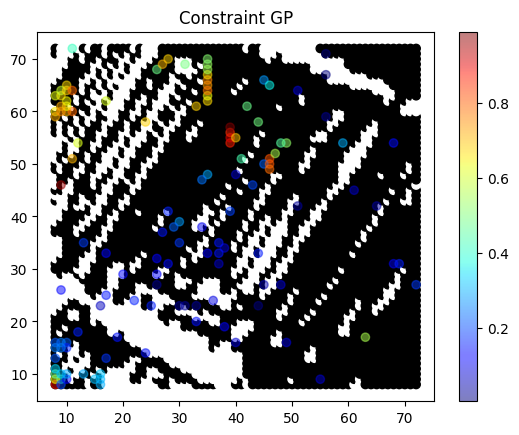

In [ ]:
plt.scatter(indices_all[:, 0], indices_all[:, 1], c=c_m, cmap="binary", alpha =1)
plt.scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =0.5)
#plt.imshow(c_m.reshape((65,65)), origin = 'lower')
plt.colorbar()
plt.title('Constraint GP')
plt.show()

- Loop Area

In [ ]:
rng_key, rng_key_predict = gpax.utils.get_keys(1000)
data_dim = X.shape[-1]
# update posterior
dkl = gpax.viDKL(data_dim, 2, kernel='Matern')
dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
    rng_key, X_measured, y_measured, num_steps=1000, step_size=0.005)
y_pred, y_var = dkl.predict(rng_key_predict, X)

100%|██████████| 1000/1000 [00:36<00:00, 27.23it/s, init loss: 20278.8622, avg. loss [951-1000]: 18938.8821]



Inferred GP kernel parameters
k_length         [0.4779 0.5285]
k_scale          0.343
noise            0.010100000000000001


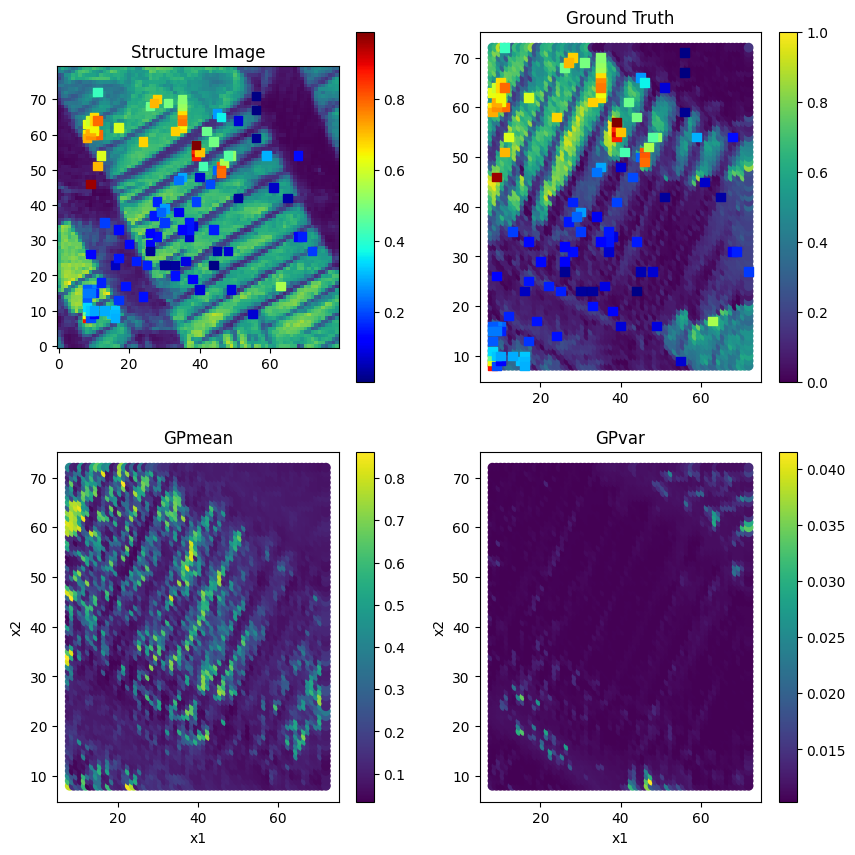

In [ ]:

fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
ax[0, 0].imshow(struc_img, origin = "lower")
a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 0].set_title("Structure Image")

a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 1].set_title("Ground Truth")

#b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
b= ax[1, 0].scatter(indices_all[:, 0], indices_all[:, 1], c=y_pred)
plt.colorbar(b, orientation='vertical')
ax[1, 0].set_xlabel("x1")
ax[1, 0].set_ylabel("x2")
ax[1, 0].set_title("GPmean")

#b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
b= ax[1, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y_var)
plt.colorbar(b, orientation='vertical')
ax[1, 1].set_xlabel("x1")
ax[1, 1].set_ylabel("x2")
ax[1, 1].set_title("GPvar")
plt.show()

In [ ]:
c_m_SANE_dc = np.load("c_m.npy")

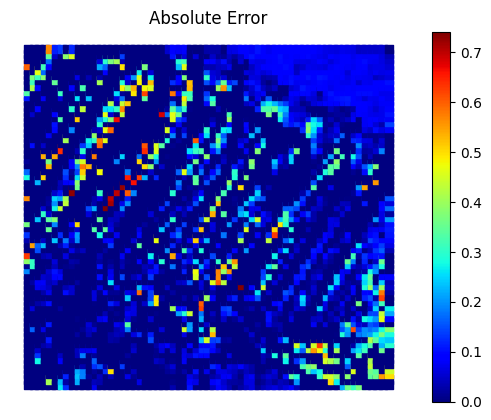

Mean error: 0.061251835075457076


In [ ]:
a=plt.scatter(indices_all[:, 0], indices_all[:, 1], c=np.abs(y-y_pred)*c_m_SANE_dc, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Absolute Error')
plt.axis("off")
plt.show()
print("Mean error: "+str(np.mean(np.abs(y-y_pred)*c_m_SANE_dc)))

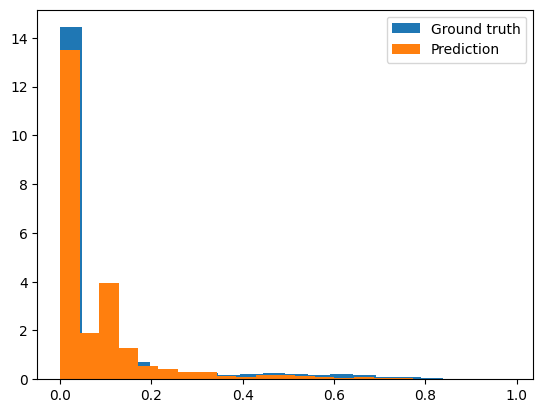

In [ ]:
plt.hist(y*c_m_SANE_dc, bins=20, density=True, label="Ground truth")
plt.hist(y_pred*c_m_SANE_dc, bins=20, density=True, label="Prediction")
plt.legend()
plt.show()

In [ ]:
hist1, _ = np.histogram(y*c_m_SANE_dc, bins=20, density=True)
hist2, _ = np.histogram(y_pred*c_m_SANE_dc, bins=20, density=True)
minima = np.minimum(hist1, hist2)
intersection = np.true_divide(np.sum(minima), np.sum(hist2))
intersection

0.8129460212681654

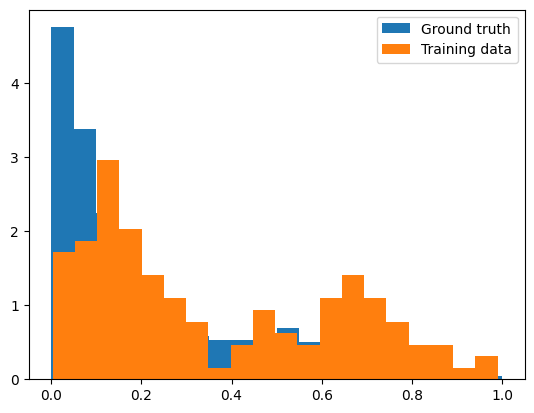

In [ ]:
plt.hist(y, bins=20, density=True, label="Ground truth")
#plt.hist(y*c_m, bins=20, density=True, label="Ground truth with constraint")
plt.hist(y_measured, bins=20, density=True, label="Training data")
plt.legend()
plt.show()

In [ ]:
y_pred_SANE_fc = y_pred
y_measured_SANE_fc = y_measured
np.save("y_pred_SANE_fc.npy", y_pred_SANE_fc)
np.save("y_measured_SANE_fc.npy", y_measured_SANE_fc)

# Case 3:Run Strategic BO
- Dynamic constraint updated from BO sampled data
- Constraint penalty = $1000$

In [ ]:
X_measured = train_x
y_measured = train_y
indices_measured = train_indices
indices_measured_norm = train_indices_norm
X_measured.shape, y_measured.shape, indices_measured.shape, indices_measured_norm.shape

((30, 256), (30,), (30, 2), (30, 2))

In [ ]:
X_unmeasured = np.delete(X, train_idx, 0)
y_unmeasured = np.delete(y, train_idx, 0)
indices_unmeasured = np.delete(indices_all, train_idx, 0)
indices_unmeasured_norm = np.delete(indices_all_norm, train_idx, 0)
X_unmeasured.shape, y_unmeasured.shape, indices_unmeasured.shape, indices_unmeasured_norm.shape

((4195, 256), (4195,), (4195, 2), (4195, 2))

In [ ]:
y_vote = y_vote[0:30]

In [ ]:
N = 100 # Number of iterations
n = 5 # Check for best results
m = 0

# Get random number generator keys for training and prediction
rng_key, rng_key_predict = gpax.utils.get_keys(1)
idx = []
best_x = indices_measured[np.argmax(y_measured)]
best_x_norm = indices_measured_norm[np.argmax(y_measured)]
exp_x = [int(np.argmax(y_measured))]
cost = np.zeros((N, 2))
for i in range(1, N+1):
    print("Step:"+str(i))
    # Checking criteria wheather we find a potential region of interest to exploit-- can be a local or global optima
    if m == n:
        best_x = indices_measured[exp_x[-1]]
        best_x_norm = indices_measured_norm[exp_x[-1]]
        m = 0

        if np.isin(exp_x, int(np.argmax(y_measured))).any()== True: #New potential region of interest found with low function values

            y_train_norm = (y_measured-np.min(y_measured))/(np.max(y_measured)-np.min(y_measured))
            best_y_norm = np.max(y_train_norm)
            # Need to provide normalized value of X and Y
            print("Checking for ROI with potntial local optima")
            exp_x = check_ROI(indices_measured_norm, y_train_norm, best_x_norm, best_y_norm, exp_x)
            best_x = indices_measured[exp_x[-1]]
            best_x_norm = indices_measured_norm[exp_x[-1]]
        else:
            exp_x = np.hstack((exp_x, int(np.argmax(y_measured)))) #New potential ROI found with higher function values
            best_x = indices_measured[exp_x[-1]]
            best_x_norm = indices_measured_norm[exp_x[-1]]
            print("New ROI with potential global optima found")

    m = m + 1

    # Execute contraint dKL
    print("Running GP for constraint evaluation")
    cGP, constraint_mean, _= run_constraindkl(X_measured, y_vote, X_unmeasured)



    # Execute dKL
    print("Running GP for function evaluation")
    X_unmeasured_norm = (X_unmeasured-np.min(X_unmeasured))/(np.max(X_unmeasured)-np.min(X_unmeasured))
    test_data = [X_unmeasured, X_unmeasured_norm, indices_unmeasured]
    cost_params = [best_x, exp_x, c_loc, c_glo, int(k[i-1])]
    #constraint_mean_norm = (constraint_mean-np.min(constraint_mean))/(np.max(constraint_mean)-np.min(constraint_mean))

    gpbo, obj, y_pred, y_var = run_statdKL(X_measured, y_measured, indices_measured, test_data, constraint = constraint_mean, pen=1000, cost_params= cost_params)

    # Select next point to "measure"
    next_point_idx = obj.argmax()
    # Do "measurement"
    measured_point = y_unmeasured[next_point_idx]
    # Plot current result
    if ((i == 1) or ((i % 15) == 0)): # Check predictions after every 15 BO runs

      #Plot constraint map
      c_m = np.zeros_like((constraint_mean))
      for j in range(0, len(constraint_mean)):
        if constraint_mean[j] < 0:
          c_m[j] = 0
        else:
          c_m[j] = 1

      plt.scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=c_m, cmap="binary", alpha =1)
      plt.scatter(indices_all[:, 0], indices_all[:, 1], c=y, cmap="viridis", alpha=0.1)
      #plt.imshow(c_m.reshape((65,65)), origin = 'lower')
      plt.colorbar()
      plt.title('Constraint GP')
      plt.show()

      # Plot exploration and function map
      fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
      ax[0, 0].imshow(struc_img, origin = "lower")
      a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 0].set_title("Structure Image")

      a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
      ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
      plt.colorbar(a, orientation='vertical')
      ax[0, 1].set_title("Ground Truth")

      #b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
      b= ax[1, 0].scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=y_pred)
      ax[1, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured)
      plt.colorbar(b, orientation='vertical')
      ax[1, 0].set_xlabel("x1")
      ax[1, 0].set_ylabel("x2")
      ax[1, 0].set_title("GPmean")

      #b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
      b= ax[1, 1].scatter(indices_unmeasured[:, 0], indices_unmeasured[:, 1], c=y_var)
      #ax[1, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured)
      plt.colorbar(b, orientation='vertical')
      ax[1, 1].set_xlabel("x1")
      ax[1, 1].set_ylabel("x2")
      ax[1, 1].set_title("GPvar")
      plt.show()

    plot_result(indices_unmeasured, obj, pol_data)
    #np.savez("singleDKL_step{}.npz".format(e), next_point_idx = next_point_idx, obj = obj, X_measured = X_measured,
    #         X_unmeasured = X_unmeasured, y_measured = y_measured, y_unmeasured = y_unmeasured,
    #         indices_measured = indices_measured, indices_unmeasured = indices_unmeasured)
    # Update the arrays of measured/unmeasured points
    X_measured = np.append(X_measured, X_unmeasured[next_point_idx][None], 0)
    X_unmeasured = np.delete(X_unmeasured, next_point_idx, 0)
    y_measured = np.append(y_measured, measured_point)
    y_unmeasured = np.delete(y_unmeasured, next_point_idx)
    indices_measured = np.append(indices_measured, indices_unmeasured[next_point_idx][None], 0)
    indices_unmeasured = np.delete(indices_unmeasured, next_point_idx, 0)
    indices_measured_norm = np.append(indices_measured_norm, indices_unmeasured_norm[next_point_idx][None], 0)
    indices_unmeasured_norm = np.delete(indices_unmeasured_norm, next_point_idx, 0)


    # Update distance metric for new X
    for j1 in range(0, len(idx_good)):
      y_good = y_good + np.absolute(indices_measured[-1, 0] -  indices_all[idx_good[j1], 0]) + np.absolute(indices_measured[-1, 1] -  indices_all[idx_good[j1], 1])
    y_good = y_good/len(idx_good)


    for j2 in range(0, len(idx_bad)):
      y_bad = y_bad + np.absolute(indices_measured[-1, 0] -  indices_all[idx_bad[j2], 0]) + np.absolute(indices_measured[-1, 1] -  indices_all[idx_bad[j2], 1])
    y_bad = y_bad/len(idx_bad)

    y_vote = np.hstack((y_vote, (y_bad - y_good))) # Maximizing the target constraint





# Final prediction and plotting

- Constraint

100%|██████████| 1000/1000 [00:07<00:00, 126.48it/s, init loss: 21760.3903, avg. loss [951-1000]: 19510.2228]



Inferred GP kernel parameters
k_length         [0.967  0.8151]
k_scale          9.7085
noise            0.7684000000000001


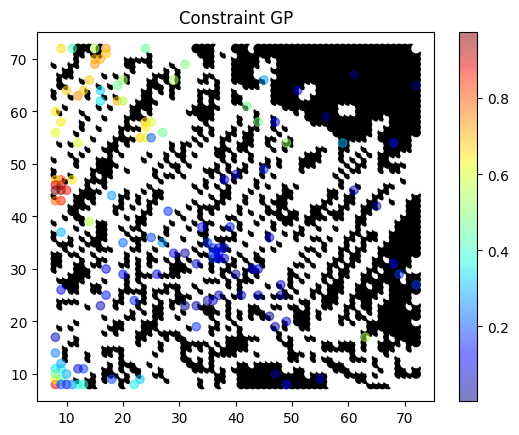

In [ ]:
cGP, constraint_mean, _= run_constraindkl(X_measured, y_vote, X)
#Plot constraint map
c_m = np.zeros_like((constraint_mean))
for j in range(0, len(constraint_mean)):
  if constraint_mean[j] < 0:
    c_m[j] = 0
  else:
    c_m[j] = 1

plt.scatter(indices_all[:, 0], indices_all[:, 1], c=c_m, cmap="binary", alpha =1)
plt.scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =0.5)
#plt.imshow(c_m.reshape((65,65)), origin = 'lower')
plt.colorbar()
plt.title('Constraint GP')
plt.show()

- Loop Area

In [ ]:
rng_key, rng_key_predict = gpax.utils.get_keys(1)
data_dim = X.shape[-1]
# update posterior
dkl = gpax.viDKL(data_dim, 2, kernel='Matern')
dkl.fit(  # you may decrease step size and increase number of steps (e.g. to 0.005 and 1000) for more stable performance
    rng_key, X_measured, y_measured, num_steps=1000, step_size=0.005)
y_pred, y_var = dkl.predict(rng_key_predict, X)

100%|██████████| 1000/1000 [00:08<00:00, 114.94it/s, init loss: 20288.7336, avg. loss [951-1000]: 18946.6286]



Inferred GP kernel parameters
k_length         [0.4103 0.4267]
k_scale          0.3407
noise            0.0131


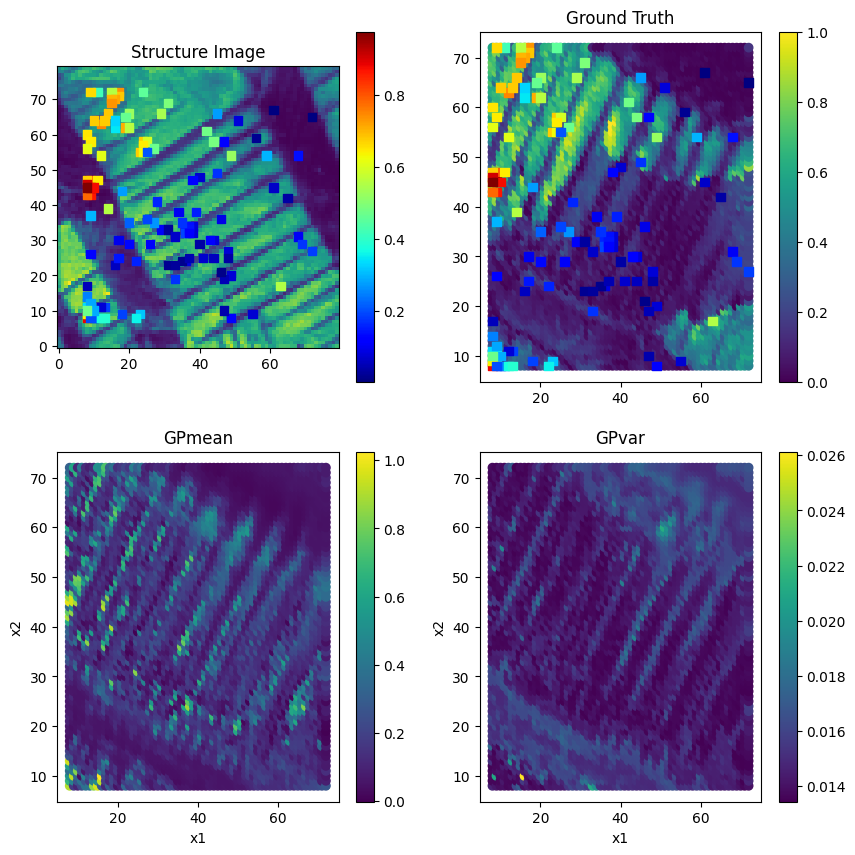

In [ ]:
fig, ax = plt.subplots(nrows= 2, ncols = 2, figsize=(10, 10))
ax[0, 0].imshow(struc_img, origin = "lower")
a=ax[0, 0].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 0].set_title("Structure Image")

a = ax[0, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y)
ax[0, 1].scatter(indices_measured[:, 0], indices_measured[:, 1], c=y_measured, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0, 1].set_title("Ground Truth")

#b= ax[1, 0].imshow(y_pred.reshape((65,65)), origin = 'lower')
b= ax[1, 0].scatter(indices_all[:, 0], indices_all[:, 1], c=y_pred)
plt.colorbar(b, orientation='vertical')
ax[1, 0].set_xlabel("x1")
ax[1, 0].set_ylabel("x2")
ax[1, 0].set_title("GPmean")

#b= ax[1, 1].imshow(y_var.reshape((65,65)), origin = 'lower')
b= ax[1, 1].scatter(indices_all[:, 0], indices_all[:, 1], c=y_var)
plt.colorbar(b, orientation='vertical')
ax[1, 1].set_xlabel("x1")
ax[1, 1].set_ylabel("x2")
ax[1, 1].set_title("GPvar")
plt.show()

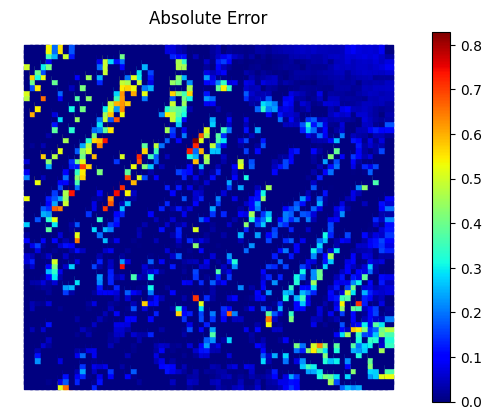

Mean error: 0.059231475553153175


In [ ]:

a=plt.scatter(indices_all[:, 0], indices_all[:, 1], c=np.abs(y-y_pred)*c_m, cmap="jet", alpha =1, marker="s")
plt.colorbar(a)
plt.title('Absolute Error')
plt.axis("off")
plt.show()
print("Mean error: "+str(np.mean(np.abs(y-y_pred)*c_m)))

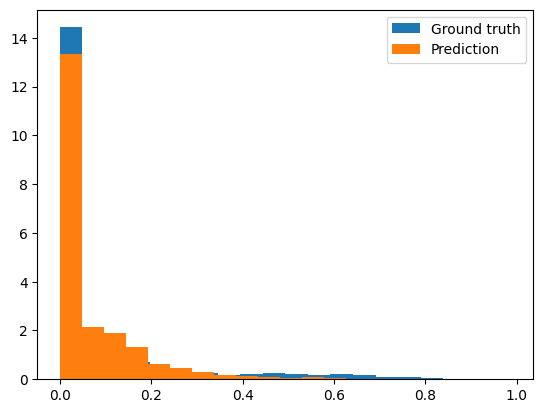

In [ ]:
plt.hist(y*c_m, bins=20, density=True, label="Ground truth")
plt.hist(y_pred*c_m, bins=20, density=True, label="Prediction")
plt.legend()
plt.show()

In [ ]:
hist1, _ = np.histogram(y*c_m, bins=20, density=True)
hist2, _ = np.histogram(y_pred*c_m, bins=20, density=True)
minima = np.minimum(hist1, hist2)
intersection = np.true_divide(np.sum(minima), np.sum(hist2))
intersection

0.8744267584121176

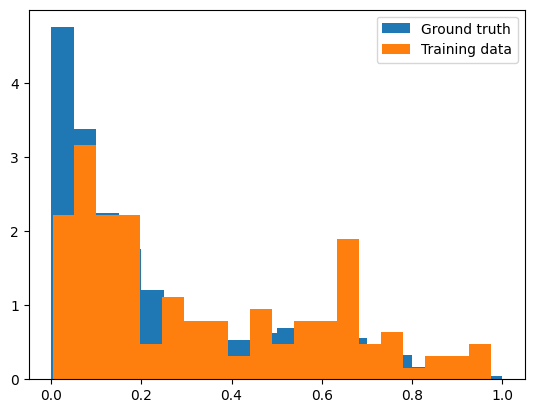

In [ ]:
plt.hist(y, bins=20, density=True, label="Ground truth")
#plt.hist(y*c_m, bins=20, density=True, label="Ground truth with constraint")
plt.hist(y_measured, bins=20, density=True, label="Training data")
plt.legend()
plt.show()

In [ ]:
y_pred_SANE_dc = y_pred
y_measured_SANE_dc = y_measured
np.save("c_m.npy", c_m)
np.save("y_pred_SANE_dc.npy", y_pred_SANE_dc)
np.save("y_measured_SANE_dc.npy", y_measured_SANE_dc)

#

# Histogram for all scenarios

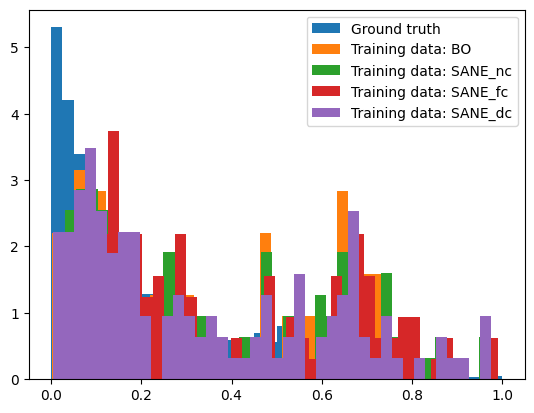

In [ ]:
plt.hist(y, bins=40, density=True, label="Ground truth")
plt.hist(y_measured_BO, bins=40, density=True, label="Training data: BO")
plt.hist(y_measured_SANE_nc, bins=40, density=True, label="Training data: SANE_nc")
plt.hist(y_measured_SANE_fc, bins=40, density=True, label="Training data: SANE_fc")
plt.hist(y_measured_SANE_dc, bins=40, density=True, label="Training data: SANE_dc")
plt.legend()
plt.show()

In [ ]:
!gdown https://drive.google.com/uc?id=1cgKBIO8yITC43H1wjGnKOpHn0Lup7TeN
!gdown https://drive.google.com/uc?id=15arTwOpvMPp5RvGfeJIhPSiRnRTDmRwf
!gdown https://drive.google.com/uc?id=1IEa4b9pHD-iW4-xX-QwYKoF0D4HaXoBa
!gdown https://drive.google.com/uc?id=1M-EI6rLyrEWN0N1eOqy09VRPyBXg4yMT

Downloading...
From: https://drive.google.com/uc?id=1cgKBIO8yITC43H1wjGnKOpHn0Lup7TeN
To: /content/y_measured_SANE_nc.npy
100% 1.17k/1.17k [00:00<00:00, 7.41MB/s]
Downloading...
From: https://drive.google.com/uc?id=15arTwOpvMPp5RvGfeJIhPSiRnRTDmRwf
To: /content/y_measured_SANE_fc.npy
100% 1.17k/1.17k [00:00<00:00, 7.12MB/s]
Downloading...
From: https://drive.google.com/uc?id=1IEa4b9pHD-iW4-xX-QwYKoF0D4HaXoBa
To: /content/y_measured_SANE_dc.npy
100% 1.17k/1.17k [00:00<00:00, 8.02MB/s]
Downloading...
From: https://drive.google.com/uc?id=1M-EI6rLyrEWN0N1eOqy09VRPyBXg4yMT
To: /content/c_m.npy
100% 33.9k/33.9k [00:00<00:00, 95.4MB/s]


In [ ]:
y_measured_SANE_nc= np.load("y_measured_SANE_nc.npy")
y_measured_SANE_fc= np.load("y_measured_SANE_fc.npy")
y_measured_SANE_dc= np.load("y_measured_SANE_dc.npy")
c_m_dc = np.load("c_m.npy")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import pandas as pd

Indices_explored_SANE = pd.read_csv('/content/gdrive/MyDrive/Data/SANE/Indices_explored_SANE.csv', header=None)
Indices_explored_SANE = Indices_explored_SANE.to_numpy()
Indices_explored_SANE

Text(0.5, 1.0, 'SANE: tight gate')

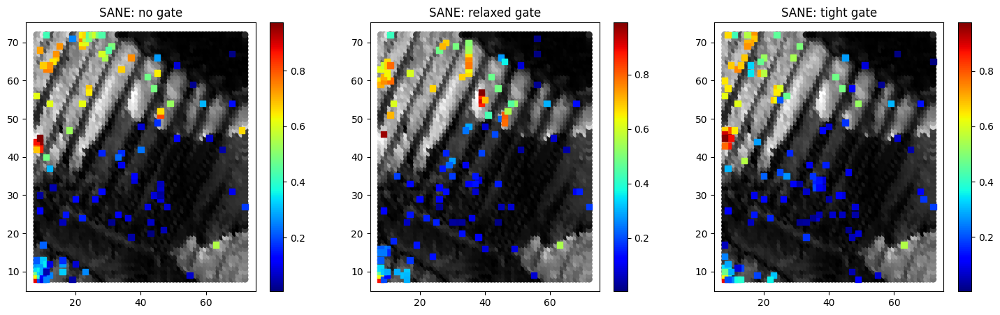

In [ ]:
fig, ax = plt.subplots(nrows= 1, ncols = 3, figsize=(18, 5))
ax[0].scatter(indices_all[:, 0], indices_all[:, 1], c=y, cmap="gray")
a=ax[0].scatter(Indices_explored_SANE[:, 0], Indices_explored_SANE[:, 1], c=y_measured_SANE_nc, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[0].set_title("SANE: no gate")

ax[1].scatter(indices_all[:, 0], indices_all[:, 1], c=y, cmap="gray")
a=ax[1].scatter(Indices_explored_SANE[:, 2], Indices_explored_SANE[:, 3], c=y_measured_SANE_fc, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[1].set_title("SANE: relaxed gate")

ax[2].scatter(indices_all[:, 0], indices_all[:, 1], c=y, cmap="gray")
a=ax[2].scatter(Indices_explored_SANE[:, 4], Indices_explored_SANE[:, 5], c=y_measured_SANE_dc, cmap="jet", alpha =1, marker="s")
plt.colorbar(a, orientation='vertical')
ax[2].set_title("SANE: tight gate")